<a href="https://colab.research.google.com/github/dkbean/Improved-stability-of-WGAN-GP/blob/main/7.%20WGAN-GP%20CelebA%20(implement%20learning%20rate%20schedule).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!mkdir generator

In [ ]:
#Create folders to save 3000 generated images for each n epochs
import os
import subprocess

n=10
# Specify the base folder where you want to create the subfolders
base_folder = ""  # Replace with your desired base folder path


# Create 15 folders with the specified naming pattern
for x in range(0, 801, n):
    folder_name = f'celebGenerated_wgan_{x}epochs'
    folder_path = os.path.join(base_folder, folder_name)

    try:
        os.makedirs(folder_path)
        print(f"Created folder: {folder_path}")
    except FileExistsError:
        print(f"Folder already exists: {folder_path}")

print("Folders created successfully.")

Created folder: celebGenerated_wgan_0epochs
Created folder: celebGenerated_wgan_10epochs
Created folder: celebGenerated_wgan_20epochs
Created folder: celebGenerated_wgan_30epochs
Created folder: celebGenerated_wgan_40epochs
Created folder: celebGenerated_wgan_50epochs
Created folder: celebGenerated_wgan_60epochs
Created folder: celebGenerated_wgan_70epochs
Created folder: celebGenerated_wgan_80epochs
Created folder: celebGenerated_wgan_90epochs
Created folder: celebGenerated_wgan_100epochs
Created folder: celebGenerated_wgan_110epochs
Created folder: celebGenerated_wgan_120epochs
Created folder: celebGenerated_wgan_130epochs
Created folder: celebGenerated_wgan_140epochs
Created folder: celebGenerated_wgan_150epochs
Created folder: celebGenerated_wgan_160epochs
Created folder: celebGenerated_wgan_170epochs
Created folder: celebGenerated_wgan_180epochs
Created folder: celebGenerated_wgan_190epochs
Created folder: celebGenerated_wgan_200epochs
Created folder: celebGenerated_wgan_210epochs

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!pip install pytorch-fid

In [ ]:
# !pip uninstall tensorflow -y


In [ ]:
# !pip install  tensorflow==2.8.0

In [ ]:
!unzip /content/drive/MyDrive/celeb_test.zip -d ./

Archive:  /content/drive/MyDrive/celeb_test.zip
   creating: ./celeb_test/
  inflating: ./celeb_test/celeb_429.jpg  
  inflating: ./celeb_test/celeb_812.jpg  
  inflating: ./celeb_test/celeb_287.jpg  
  inflating: ./celeb_test/celeb_1096.jpg  
  inflating: ./celeb_test/celeb_1442.jpg  
  inflating: ./celeb_test/celeb_1856.jpg  
  inflating: ./celeb_test/celeb_1120.jpg  
  inflating: ./celeb_test/celeb_783.jpg  
  inflating: ./celeb_test/celeb_2591.jpg  
  inflating: ./celeb_test/celeb_305.jpg  
  inflating: ./celeb_test/celeb_1577.jpg  
  inflating: ./celeb_test/celeb_2713.jpg  
  inflating: ./celeb_test/celeb_1758.jpg  
  inflating: ./celeb_test/celeb_23.jpg  
  inflating: ./celeb_test/celeb_268.jpg  
  inflating: ./celeb_test/celeb_17.jpg  
  inflating: ./celeb_test/celeb_419.jpg  
  inflating: ./celeb_test/celeb_729.jpg  
  inflating: ./celeb_test/celeb_2539.jpg  
  inflating: ./celeb_test/celeb_1255.jpg  
  inflating: ./celeb_test/celeb_2746.jpg  
  inflating: ./celeb_test/celeb_13

In [ ]:
!unzip /content/drive/MyDrive/celeb_train_20k.zip -d ./

Streaming output truncated to the last 5000 lines.
  inflating: ./celeb_train_20k/015536.jpg  
  inflating: ./celeb_train_20k/015537.jpg  
  inflating: ./celeb_train_20k/015538.jpg  
  inflating: ./celeb_train_20k/015539.jpg  
  inflating: ./celeb_train_20k/015540.jpg  
  inflating: ./celeb_train_20k/015541.jpg  
  inflating: ./celeb_train_20k/015542.jpg  
  inflating: ./celeb_train_20k/015543.jpg  
  inflating: ./celeb_train_20k/015544.jpg  
  inflating: ./celeb_train_20k/015545.jpg  
  inflating: ./celeb_train_20k/015546.jpg  
  inflating: ./celeb_train_20k/015547.jpg  
  inflating: ./celeb_train_20k/015548.jpg  
  inflating: ./celeb_train_20k/015549.jpg  
  inflating: ./celeb_train_20k/015550.jpg  
  inflating: ./celeb_train_20k/015551.jpg  
  inflating: ./celeb_train_20k/015552.jpg  
  inflating: ./celeb_train_20k/015553.jpg  
  inflating: ./celeb_train_20k/015554.jpg  
  inflating: ./celeb_train_20k/015555.jpg  
  inflating: ./celeb_train_20k/015556.jpg  
  inflating: ./celeb_trai

In [ ]:
import tensorflow as tf

from tensorflow import keras
from tensorflow.keras.models import Sequential
from tensorflow.keras import layers
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam

from matplotlib import pyplot as plt
import numpy as np

import os

In [ ]:
! pwd


/content


In [ ]:
print(tf.version.VERSION)

2.15.0


In [ ]:
celeb_data_dir = "/content/celeb_train_20k"

In [ ]:
FID_scores = []
def lastWord(string): # get the FID score from the FID command's result

    # split by space and converting
    # string to list and
    lis = list(string.split(" "))

    # length of list
    length = len(lis)

    # returning last element in list
    return lis[length-1]

In [ ]:
train_images = tf.keras.utils.image_dataset_from_directory(
    celeb_data_dir, label_mode=None, image_size=(64, 64), batch_size=256 # Margaret: increase batch size from 32
)

Found 20535 files belonging to 1 classes.


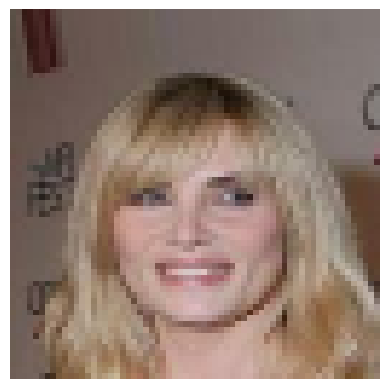

In [ ]:
image_batch = next(iter(train_images))
random_index = np.random.choice(image_batch.shape[0])
random_image = image_batch[random_index].numpy().astype("int32")

# Visualize 1 random image from the training dataset
plt.axis("off")
plt.imshow(random_image)
plt.show()

In [ ]:
def show(images):
    plt.figure(figsize=(4, 4))

    for i in range(16):
        plt.subplot(4, 4, i+1)
        img = keras.utils.array_to_img(images[i])
        plt.imshow(img)
        plt.axis('off')
    plt.show()

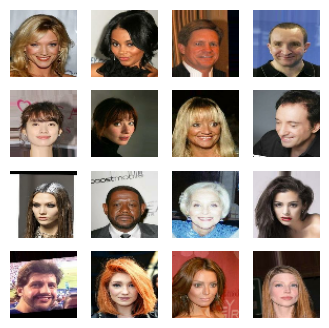

In [ ]:
# Visualize 16 images from the training dataset
show(image_batch[:16])

In [ ]:
# Normalize the images to [-1, 1] which is the range of the tanh activation
train_images = train_images.map(lambda x: (x - 127.5) / 127.5)

In [ ]:
# latent dimension of the random noise
LATENT_DIM = 128

WEIGHT_INIT = tf.keras.initializers.RandomNormal(mean=0.0, stddev=0.02)
# number of channels, 1 for gray scale and 3 for color images
CHANNELS = 3

In [ ]:
def build_generator():
    # create a Keras Sequential model
    model = Sequential(name="generator")

    # prepare for reshape: FC => BN => RN layers, note: input shape defined in the 1st Dense layer
    model.add(layers.Dense(8 * 8 * 512, input_dim=LATENT_DIM))
    # model.add(layers.BatchNormalization())
    model.add(layers.ReLU())
    # layers.LeakyReLU(alpha=0.2),

    # 1D => 3D: reshape the output of the previous layer
    model.add(layers.Reshape((8, 8, 512)))

    # upsample to 16x16: apply a transposed CONV => BN => RELU
    model.add(layers.Conv2DTranspose(256, (4, 4),
                                     strides=(2, 2),
                                     padding="same",
                                     use_bias=False,
                                     kernel_initializer=WEIGHT_INIT))
    model.add(layers.BatchNormalization())
    model.add((layers.ReLU()))

    # upsample to 32x32: apply a transposed CONV => BN => RELU
    model.add(layers.Conv2DTranspose(128, (4, 4),
                                     strides=(2, 2),
                                     padding="same",
                                     use_bias=False,
                                     kernel_initializer=WEIGHT_INIT))
    model.add(layers.BatchNormalization())
    model.add((layers.ReLU()))

    # upsample to 64x64: apply a transposed CONV => BN => RELU
    model.add(layers.Conv2DTranspose(64, (4, 4),
                                     strides=(2, 2),
                                     padding="same",
                                     use_bias=False,
                                     kernel_initializer=WEIGHT_INIT))
    model.add(layers.BatchNormalization())
    model.add((layers.ReLU()))

    # final layer: Conv2D with tanh activation
    model.add(layers.Conv2D(CHANNELS, (4, 4), padding="same", activation="tanh"))

    # return the generator model
    return model

In [ ]:
# build the generator model
generator = build_generator()

/usr/local/lib/python3.10/dist-packages/keras/src/initializers/initializers.py:120: UserWarning: The initializer RandomNormal is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initializer instance more than once.
  warnings.warn(


In [ ]:
generator.summary()

Model: "generator"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 32768)             4227072   
                                                                 
 re_lu (ReLU)                (None, 32768)             0         
                                                                 
 reshape (Reshape)           (None, 8, 8, 512)         0         
                                                                 
 conv2d_transpose (Conv2DTr  (None, 16, 16, 256)       2097152   
 anspose)                                                        
                                                                 
 batch_normalization (Batch  (None, 16, 16, 256)       1024      
 Normalization)                                                  
                                                                 
 re_lu_1 (ReLU)              (None, 16, 16, 256)       0 

In [ ]:
def build_critic(height, width, depth, alpha=0.2):
    # Weight clipping to [-1, 1] to enfoce 1-Lipschitz constraint
    # constraint = WeightClip(0.01) # UPDATE for WGAN-GP: remove weight clipping

    # create a Keras Sequential model
    model = Sequential(name="critic")
    input_shape = (height, width, depth)

    # 1. first set of CONV => BN => leaky ReLU layers
    model.add(layers.Conv2D(64, (4, 4),
                            padding="same",
                            strides=(2, 2),
                            # kernel_constraint = constraint, # UPDATE for WGAN-GP: remove weight clipping
                            input_shape=input_shape))
    # model.add(layers.BatchNormalization()) # UPDATE for WGAN-GP: remove batchnorm
    model.add(layers.LeakyReLU(alpha=alpha))

    # 2. second set of CONV => BN => leacy ReLU layers
    model.add(layers.Conv2D(128, (4, 4),
                            padding="same",
                            strides=(2, 2)))
                            # kernel_constraint = constraint,)) # UPDATE for WGAN-GP: remove weight clipping
    # model.add(layers.BatchNormalization()) # UPDATE for WGAN-GP: remove batchnorm
    model.add(layers.LeakyReLU(alpha=alpha))

    # 3. third set of CONV => BN => leacy ReLU layers
    model.add(layers.Conv2D(128, (4, 4),
                            padding="same",
                            strides=(2, 2)))
                            # kernel_constraint = constraint,)) # UPDATE for WGAN-GP: remove weight clipping
    # model.add(layers.BatchNormalization()) # UPDATE for WGAN-GP: remove batchnorm
    model.add(layers.LeakyReLU(alpha=alpha))

    # flatten and apply dropout
    model.add(layers.Flatten())
    model.add(layers.Dropout(0.3))

    # linear activation in the last layer
    # Note: Keras `Dense` layer by default is already a `linear` activation
    model.add(layers.Dense(1, activation="linear"))

    # return the critic model
    return model

In [ ]:
# build the critic model
critic = build_critic(64, 64, 3)

In [ ]:
critic.summary()

Model: "critic"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_1 (Conv2D)           (None, 32, 32, 64)        3136      
                                                                 
 leaky_re_lu (LeakyReLU)     (None, 32, 32, 64)        0         
                                                                 
 conv2d_2 (Conv2D)           (None, 16, 16, 128)       131200    
                                                                 
 leaky_re_lu_1 (LeakyReLU)   (None, 16, 16, 128)       0         
                                                                 
 conv2d_3 (Conv2D)           (None, 8, 8, 128)         262272    
                                                                 
 leaky_re_lu_2 (LeakyReLU)   (None, 8, 8, 128)         0         
                                                                 
 flatten (Flatten)           (None, 8192)              0    

In [ ]:
class WGAN_GP(keras.Model):
    def __init__(self,
                 critic,
                 generator,
                 latent_dim,
                 critic_extra_steps,
                 gp_weight=10.0): # UPDATE for WGAN-GP: gradient penalty weight
        super().__init__()
        self.critic = critic
        self.generator = generator
        self.latent_dim = latent_dim
        self.c_extra_steps = critic_extra_steps
        self.gp_weight = gp_weight # WGAN-GP
        self.d_loss_metric = keras.metrics.Mean(name="d_loss")
        self.g_loss_metric = keras.metrics.Mean(name="g_loss")


    def compile(self, d_optimizer, g_optimizer, d_loss_fn, g_loss_fn):
        super(WGAN_GP, self).compile()
        self.d_optimizer = d_optimizer
        self.g_optimizer = g_optimizer
        self.d_loss_fn = d_loss_fn
        self.g_loss_fn = g_loss_fn

    @property
    def metrics(self):
        return [self.d_loss_metric, self.g_loss_metric]

    # UPDATE for WGAN-GP: use gradient penalty instead of weight clipping
    def gradient_penalty(self, batch_size, real_images, fake_images):
        """ Calculates the gradient penalty.

        Gradient penalty is calculated on an interpolated image
        and added to the discriminator loss.
        """

        alpha = tf.random.normal([batch_size, 1, 1, 1], 0.0, 1.0)
        diff = fake_images - real_images
        # 1. Create the interpolated image
        interpolated = real_images + alpha * diff

        with tf.GradientTape() as gp_tape:
            gp_tape.watch(interpolated)
            # 2. Get the Critic's output for the interpolated image
            pred = self.critic(interpolated, training=True)

        # 3. Calculate the gradients w.r.t to the interpolated image
        grads = gp_tape.gradient(pred, [interpolated])[0]
        # 4. Calculate the norm of the gradients.
        norm = tf.sqrt(tf.reduce_sum(tf.square(grads), axis=[1, 2, 3]))
        # 5. Calculate gradient penalty
        gradient_penalty = tf.reduce_mean((norm - 1.0) ** 2)
        return gradient_penalty

    def train_step(self, real_images):

        batch_size = tf.shape(real_images)[0]
        noise = tf.random.normal(shape=(batch_size, self.latent_dim))

        # Train the critic more often than the generator by 5 times (self.c_extra_steps)
        for i in range(self.c_extra_steps):
            # Step 1. Train the critic with both real images and fake images
            with tf.GradientTape() as tape:
                pred_real = self.critic(real_images, training=True)
                fake_images = self.generator(noise, training=True)
                pred_fake = self.critic(fake_images, training=True)
                # UPDATE for WGAN-GP: Calculate the gradient penalty
                gp = self.gradient_penalty(batch_size, real_images, fake_images)
                # UPDATE for WGAN-GP: Add gradient penalty to the original critic loss
                d_loss = self.d_loss_fn(pred_real, pred_fake) + gp * self.gp_weight
            # Compute critic gradients
            grads = tape.gradient(d_loss, self.critic.trainable_variables)
            # Update critic weights
            self.d_optimizer.apply_gradients(zip(grads, self.critic.trainable_variables))

        # Step 2. Train the generator (do not update weights of the critic)
        misleading_labels = tf.ones((batch_size, 1)) # G wants D to think the fake images are real (label as 1)

        with tf.GradientTape() as tape:
            fake_images = self.generator(noise, training=True)
            pred_fake = self.critic(fake_images, training=True)
            g_loss = self.g_loss_fn(pred_fake)
        # Compute generator gradients
        grads = tape.gradient(g_loss, self.generator.trainable_variables)
        # Update generator wieghts
        self.g_optimizer.apply_gradients(zip(grads, self.generator.trainable_variables))

        self.d_loss_metric.update_state(d_loss)
        self.g_loss_metric.update_state(g_loss)

        return {"d_loss": self.d_loss_metric.result(), "g_loss": self.g_loss_metric.result()}

In [ ]:
class GANMonitor(keras.callbacks.Callback):
    def __init__(self, num_img=3, latent_dim=100):
        self.num_img = num_img
        self.latent_dim = latent_dim

        # Create random noise seed for visualization during traing
        self.seed = tf.random.normal([16, latent_dim])

    def on_epoch_end(self, epoch, logs=None):
        generated_images = self.model.generator(self.seed)
        generated_images = (generated_images * 127.5) + 127.5
        generated_images.numpy()

        if epoch % n == 0:
          fig = plt.figure(figsize=(4, 4))
          for i in range(self.num_img):
              plt.subplot(4, 4, i+1)
              img = keras.utils.array_to_img(generated_images[i])
              plt.imshow(img)
              plt.axis('off')
          plt.savefig('epoch_{:03d}.png'.format(epoch))
          plt.show()

        # calculate FID for each n epochs
        epoch_num = epoch
        if epoch % n == 0:
          folder_name = "celebGenerated_wgan_" + str(epoch_num) + "epochs"
          print(folder_name)

          noise_size = 128
          seed = tf.random.normal([3001, noise_size])
          generated_images = self.model.generator(seed)
          generated_images = (generated_images * 127.5) + 127.5
          generated_images.numpy()

          # fig = plt.figure(figsize=(4, 4))
          for i in range(1,3001):
              img = keras.utils.array_to_img(generated_images[i])
              img.save(folder_name + "/celeb_%d.jpg" % (i))

          self.model.generator.save('generator/generator'+ str(epoch_num) +'.h5')

          # Construct the command to run
          cmd = f"python -m pytorch_fid /content/celeb_test /content/{folder_name}"

          # Print the captured output
          try:
            output = subprocess.check_output(cmd, shell=True, text=True)
            print(f"Output of the calculating FID command:\n{output}")
            fid_val = float(lastWord(output))
            FID_scores.append(fid_val)
            print("FID_scores: ",FID_scores)
            # Display the current plot
            if len(FID_scores) > 10:  # only display when the FID_scores size > 10
              # Create sample data
              epochs = np.arange(0, len(FID_scores)*n, n)  # Values from 0 with a step of 10
              fid_scores = np.array(FID_scores)
              print(fid_scores)
              # Find the minimum FID score and its corresponding epoch
              min_fid_score = min(fid_scores)
              min_fid_epoch = epochs[fid_scores.argmin()]
              # Create the plot
              plt.figure(figsize=(8, 6))
              plt.plot(epochs, fid_scores, marker='o', linestyle='-')
              plt.title('FID Score Over Epochs')
              plt.xlabel('Epoch num')
              plt.ylabel('FID score')
              plt.grid(True)
              # Annotate the minimum point with a rotated text and a straight arrow
              arrow_props = dict(arrowstyle='->', connectionstyle='arc3,rad=1')
              plt.annotate(f'Min FID Score: {min_fid_score:.2f}', xy=(min_fid_epoch, min_fid_score), xytext=(min_fid_epoch + 20, min_fid_score + 10.1),
                          arrowprops=arrow_props, rotation=0, va='bottom')
              # Highlight the minimum point with a red dot
              plt.scatter(min_fid_epoch, min_fid_score, color='red', s=100, label='Min FID Score')
              # Display the plot
              plt.show()

          except subprocess.CalledProcessError as e:
            # Handle any errors that may occur during command execution
            print(f"Error running command: {e}")


    def on_train_end(self, logs=None):
        self.model.generator.save('generator.h5')

In [ ]:
wgan_gp = WGAN_GP(critic=critic,
              generator=generator,
              latent_dim=LATENT_DIM,
              critic_extra_steps=5)

In [ ]:
# NEW
# Define learning rate schedules
d_lr_schedule = keras.optimizers.schedules.ExponentialDecay(initial_learning_rate=0.00013, decay_steps=10000, decay_rate=0.9)

In [ ]:
# Wasserstein loss for the critic
def d_wasserstein_loss(pred_real, pred_fake):
    real_loss = tf.reduce_mean(pred_real)
    fake_loss = tf.reduce_mean(pred_fake)
    return fake_loss - real_loss

# Wasserstein loss for the generator
def g_wasserstein_loss(pred_fake):
    return -tf.reduce_mean(pred_fake)

In [ ]:
LR = 0.0001
d_optimizer = keras.optimizers.Adam(learning_rate=d_lr_schedule, beta_1=0, beta_2=0.9)
g_optimizer = keras.optimizers.Adam(learning_rate=LR, beta_1=0, beta_2=0.9) # UPDATE for WGAN-GP: use Adam instead of RMSProp

In [ ]:
wgan_gp.compile(
    d_optimizer=d_optimizer,
    g_optimizer=g_optimizer,
    d_loss_fn = d_wasserstein_loss,
    g_loss_fn = g_wasserstein_loss
)

In [ ]:
# NEW
# Add learning rate scheduling callback
lr_scheduler = keras.callbacks.LearningRateScheduler(lambda epoch: d_lr_schedule(epoch).numpy())

Epoch 1/802
81/81 [==============================] - ETA: 0s - d_loss: -98.9591 - g_loss: 86.0190

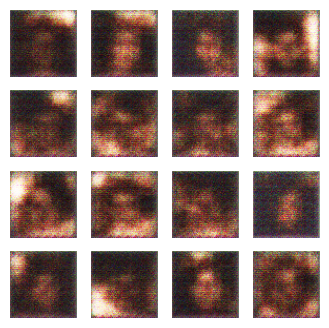

celebGenerated_wgan_0epochs


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Output of the calculating FID command:
FID:  316.47507821040205

FID_scores:  [316.47507821040205]
81/81 [==============================] - 67s 646ms/step - d_loss: -98.9591 - g_loss: 86.0190 - lr: 1.3000e-04
Epoch 2/802
81/81 [==============================] - 11s 139ms/step - d_loss: -21.1609 - g_loss: 38.9818 - lr: 1.3000e-04
Epoch 3/802
81/81 [==============================] - 11s 138ms/step - d_loss: -15.7197 - g_loss: -3.7780 - lr: 1.3000e-04
Epoch 4/802
81/81 [==============================] - 11s 139ms/step - d_loss: -13.1287 - g_loss: -30.4828 - lr: 1.3000e-04
Epoch 5/802
81/81 [==============================] - 11s 139ms/step - d_loss: -12.1788 - g_loss: -49.6190 - lr: 1.2999e-04
Epoch 6/802
81/81 [==============================] - 11s 138ms/step - d_loss: -12.1990 - g_loss: -64.5214 - lr: 1.2999e-04
Epoch 7/802
81/81 [==============================] - 11s 139ms/step - d_loss: -11.5736 - g_loss: -66.9544 - lr: 1.2999e-04
Epoch 8/802
81/81 [==============================] - 11

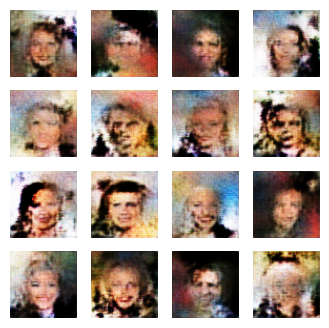

celebGenerated_wgan_10epochs


Output of the calculating FID command:
FID:  216.20374383495974

FID_scores:  [316.47507821040205, 216.20374383495974]
81/81 [==============================] - 28s 342ms/step - d_loss: -8.2355 - g_loss: -29.9449 - lr: 1.2999e-04
Epoch 12/802
81/81 [==============================] - 11s 139ms/step - d_loss: -7.6120 - g_loss: -16.8231 - lr: 1.2998e-04
Epoch 13/802
81/81 [==============================] - 11s 139ms/step - d_loss: -7.3548 - g_loss: -15.2458 - lr: 1.2998e-04
Epoch 14/802
81/81 [==============================] - 11s 139ms/step - d_loss: -7.5504 - g_loss: -18.6259 - lr: 1.2998e-04
Epoch 15/802
81/81 [==============================] - 11s 139ms/step - d_loss: -7.4950 - g_loss: -20.2714 - lr: 1.2998e-04
Epoch 16/802
81/81 [==============================] - 11s 139ms/step - d_loss: -7.4183 - g_loss: -17.2424 - lr: 1.2998e-04
Epoch 17/802
81/81 [==============================] - 11s 138ms/step - d_loss: -7.2452 - g_loss: -15.2557 - lr: 1.2998e-04
Epoch 18/802
81/81 [=============

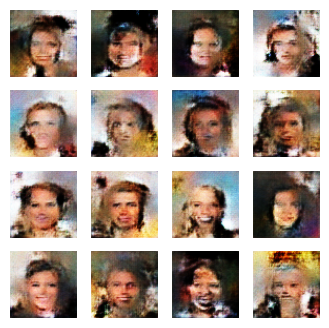

celebGenerated_wgan_20epochs


Output of the calculating FID command:
FID:  129.22607367736254

FID_scores:  [316.47507821040205, 216.20374383495974, 129.22607367736254]
81/81 [==============================] - 28s 346ms/step - d_loss: -6.7362 - g_loss: 7.8792 - lr: 1.2997e-04
Epoch 22/802
81/81 [==============================] - 11s 139ms/step - d_loss: -6.6374 - g_loss: 7.5873 - lr: 1.2997e-04
Epoch 23/802
81/81 [==============================] - 11s 138ms/step - d_loss: -6.4961 - g_loss: 3.0906 - lr: 1.2997e-04
Epoch 24/802
81/81 [==============================] - 11s 139ms/step - d_loss: -6.3576 - g_loss: -1.1245 - lr: 1.2997e-04
Epoch 25/802
81/81 [==============================] - 11s 139ms/step - d_loss: -6.3518 - g_loss: -3.9511 - lr: 1.2997e-04
Epoch 26/802
81/81 [==============================] - 11s 140ms/step - d_loss: -6.2341 - g_loss: 1.4387 - lr: 1.2997e-04
Epoch 27/802
81/81 [==============================] - 11s 140ms/step - d_loss: -6.0322 - g_loss: -0.5045 - lr: 1.2996e-04
Epoch 28/802
81/81 [====

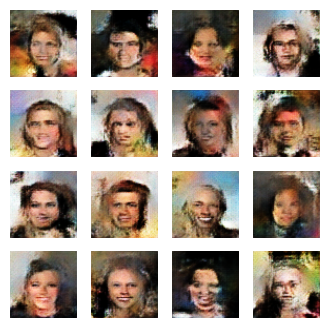

celebGenerated_wgan_30epochs


Output of the calculating FID command:
FID:  102.20768137194815

FID_scores:  [316.47507821040205, 216.20374383495974, 129.22607367736254, 102.20768137194815]
81/81 [==============================] - 28s 352ms/step - d_loss: -5.6581 - g_loss: -7.6051 - lr: 1.2996e-04
Epoch 32/802
81/81 [==============================] - 11s 140ms/step - d_loss: -5.5535 - g_loss: -7.6193 - lr: 1.2996e-04
Epoch 33/802
81/81 [==============================] - 11s 139ms/step - d_loss: -5.2958 - g_loss: -7.0995 - lr: 1.2996e-04
Epoch 34/802
81/81 [==============================] - 11s 139ms/step - d_loss: -5.3407 - g_loss: -10.0855 - lr: 1.2995e-04
Epoch 35/802
81/81 [==============================] - 11s 140ms/step - d_loss: -5.0619 - g_loss: -10.8384 - lr: 1.2995e-04
Epoch 36/802
81/81 [==============================] - 11s 139ms/step - d_loss: -5.1050 - g_loss: -6.6502 - lr: 1.2995e-04
Epoch 37/802
81/81 [==============================] - 11s 139ms/step - d_loss: -4.9866 - g_loss: -9.6311 - lr: 1.2995e-0

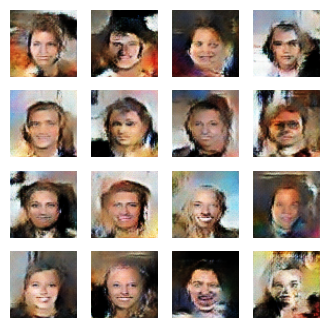

celebGenerated_wgan_40epochs


Output of the calculating FID command:
FID:  78.58580661913714

FID_scores:  [316.47507821040205, 216.20374383495974, 129.22607367736254, 102.20768137194815, 78.58580661913714]
81/81 [==============================] - 28s 351ms/step - d_loss: -4.6375 - g_loss: -6.9075 - lr: 1.2995e-04
Epoch 42/802
81/81 [==============================] - 11s 140ms/step - d_loss: -4.4486 - g_loss: -6.2452 - lr: 1.2994e-04
Epoch 43/802
81/81 [==============================] - 11s 139ms/step - d_loss: -4.5706 - g_loss: -6.4655 - lr: 1.2994e-04
Epoch 44/802
81/81 [==============================] - 11s 139ms/step - d_loss: -4.4218 - g_loss: -14.1874 - lr: 1.2994e-04
Epoch 45/802
81/81 [==============================] - 11s 139ms/step - d_loss: -4.3106 - g_loss: -13.5567 - lr: 1.2994e-04
Epoch 46/802
81/81 [==============================] - 11s 138ms/step - d_loss: -4.1988 - g_loss: -21.2887 - lr: 1.2994e-04
Epoch 47/802
81/81 [==============================] - 11s 138ms/step - d_loss: -4.2223 - g_loss: -21.

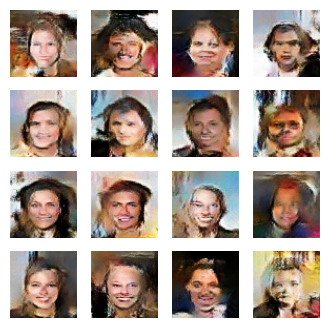

celebGenerated_wgan_50epochs


Output of the calculating FID command:
FID:  65.83086153118569

FID_scores:  [316.47507821040205, 216.20374383495974, 129.22607367736254, 102.20768137194815, 78.58580661913714, 65.83086153118569]
81/81 [==============================] - 28s 351ms/step - d_loss: -3.9604 - g_loss: -27.0145 - lr: 1.2993e-04
Epoch 52/802
81/81 [==============================] - 11s 139ms/step - d_loss: -4.0652 - g_loss: -26.8906 - lr: 1.2993e-04
Epoch 53/802
81/81 [==============================] - 11s 138ms/step - d_loss: -3.9962 - g_loss: -25.6669 - lr: 1.2993e-04
Epoch 54/802
81/81 [==============================] - 11s 139ms/step - d_loss: -3.9264 - g_loss: -24.8124 - lr: 1.2993e-04
Epoch 55/802
81/81 [==============================] - 11s 138ms/step - d_loss: -3.9268 - g_loss: -21.1160 - lr: 1.2993e-04
Epoch 56/802
81/81 [==============================] - 11s 139ms/step - d_loss: -3.9088 - g_loss: -17.4201 - lr: 1.2992e-04
Epoch 57/802
81/81 [==============================] - 11s 139ms/step - d_loss: 

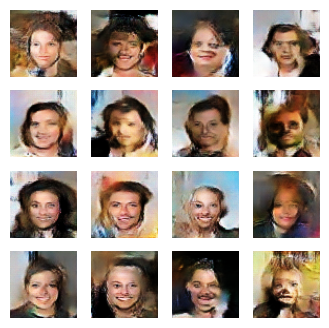

celebGenerated_wgan_60epochs


Output of the calculating FID command:
FID:  55.60348594285992

FID_scores:  [316.47507821040205, 216.20374383495974, 129.22607367736254, 102.20768137194815, 78.58580661913714, 65.83086153118569, 55.60348594285992]
81/81 [==============================] - 28s 341ms/step - d_loss: -3.6725 - g_loss: -17.4896 - lr: 1.2992e-04
Epoch 62/802
81/81 [==============================] - 11s 139ms/step - d_loss: -3.7094 - g_loss: -9.0296 - lr: 1.2992e-04
Epoch 63/802
81/81 [==============================] - 11s 138ms/step - d_loss: -3.6832 - g_loss: -4.4870 - lr: 1.2992e-04
Epoch 64/802
81/81 [==============================] - 11s 139ms/step - d_loss: -3.5719 - g_loss: -3.4861 - lr: 1.2991e-04
Epoch 65/802
81/81 [==============================] - 11s 138ms/step - d_loss: -3.5522 - g_loss: -5.2151 - lr: 1.2991e-04
Epoch 66/802
81/81 [==============================] - 11s 139ms/step - d_loss: -3.3864 - g_loss: 0.0713 - lr: 1.2991e-04
Epoch 67/802
81/81 [==============================] - 11s 138ms/st

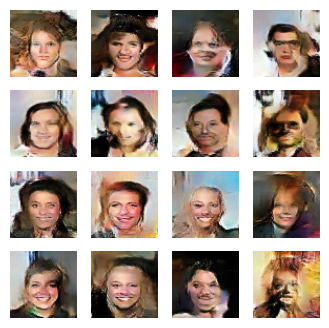

celebGenerated_wgan_70epochs


Output of the calculating FID command:
FID:  49.4864039567143

FID_scores:  [316.47507821040205, 216.20374383495974, 129.22607367736254, 102.20768137194815, 78.58580661913714, 65.83086153118569, 55.60348594285992, 49.4864039567143]
81/81 [==============================] - 28s 347ms/step - d_loss: -3.2986 - g_loss: -0.3463 - lr: 1.2990e-04
Epoch 72/802
81/81 [==============================] - 11s 139ms/step - d_loss: -3.2555 - g_loss: -0.4856 - lr: 1.2990e-04
Epoch 73/802
81/81 [==============================] - 11s 138ms/step - d_loss: -3.2054 - g_loss: 1.1698 - lr: 1.2990e-04
Epoch 74/802
81/81 [==============================] - 11s 139ms/step - d_loss: -3.1624 - g_loss: -1.3062 - lr: 1.2990e-04
Epoch 75/802
81/81 [==============================] - 11s 139ms/step - d_loss: -3.1664 - g_loss: -0.7567 - lr: 1.2990e-04
Epoch 76/802
81/81 [==============================] - 11s 139ms/step - d_loss: -3.1178 - g_loss: -2.4274 - lr: 1.2990e-04
Epoch 77/802
81/81 [==============================

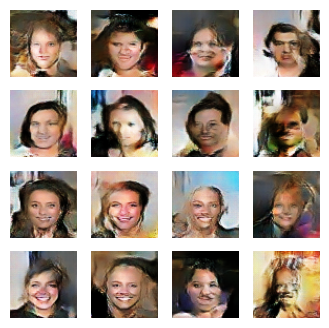

celebGenerated_wgan_80epochs


Output of the calculating FID command:
FID:  48.49285878374883

FID_scores:  [316.47507821040205, 216.20374383495974, 129.22607367736254, 102.20768137194815, 78.58580661913714, 65.83086153118569, 55.60348594285992, 49.4864039567143, 48.49285878374883]
81/81 [==============================] - 28s 342ms/step - d_loss: -2.9064 - g_loss: 1.1268 - lr: 1.2989e-04
Epoch 82/802
81/81 [==============================] - 11s 138ms/step - d_loss: -3.1098 - g_loss: -1.4702 - lr: 1.2989e-04
Epoch 83/802
81/81 [==============================] - 11s 138ms/step - d_loss: -2.9722 - g_loss: -4.9921 - lr: 1.2989e-04
Epoch 84/802
81/81 [==============================] - 11s 138ms/step - d_loss: -2.9578 - g_loss: -8.3081 - lr: 1.2989e-04
Epoch 85/802
81/81 [==============================] - 11s 139ms/step - d_loss: -2.7667 - g_loss: -7.1731 - lr: 1.2988e-04
Epoch 86/802
81/81 [==============================] - 11s 139ms/step - d_loss: -2.8047 - g_loss: -4.1660 - lr: 1.2988e-04
Epoch 87/802
81/81 [==========

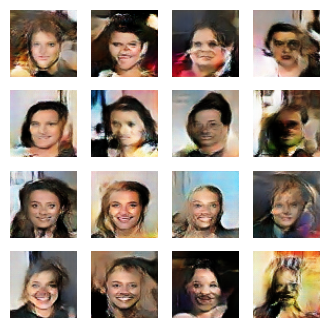

celebGenerated_wgan_90epochs


Output of the calculating FID command:
FID:  47.864060141217465

FID_scores:  [316.47507821040205, 216.20374383495974, 129.22607367736254, 102.20768137194815, 78.58580661913714, 65.83086153118569, 55.60348594285992, 49.4864039567143, 48.49285878374883, 47.864060141217465]
81/81 [==============================] - 28s 341ms/step - d_loss: -2.6776 - g_loss: 8.7844 - lr: 1.2988e-04
Epoch 92/802
81/81 [==============================] - 11s 138ms/step - d_loss: -2.5576 - g_loss: 5.9039 - lr: 1.2988e-04
Epoch 93/802
81/81 [==============================] - 11s 139ms/step - d_loss: -2.5658 - g_loss: 2.8476 - lr: 1.2987e-04
Epoch 94/802
81/81 [==============================] - 11s 139ms/step - d_loss: -2.5004 - g_loss: 4.3649 - lr: 1.2987e-04
Epoch 95/802
81/81 [==============================] - 11s 139ms/step - d_loss: -2.6211 - g_loss: 2.7254 - lr: 1.2987e-04
Epoch 96/802
81/81 [==============================] - 11s 139ms/step - d_loss: -2.5516 - g_loss: 4.8324 - lr: 1.2987e-04
Epoch 97/802
8

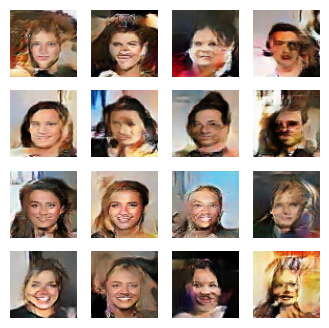

celebGenerated_wgan_100epochs


Output of the calculating FID command:
FID:  41.88248300089879

FID_scores:  [316.47507821040205, 216.20374383495974, 129.22607367736254, 102.20768137194815, 78.58580661913714, 65.83086153118569, 55.60348594285992, 49.4864039567143, 48.49285878374883, 47.864060141217465, 41.88248300089879]
[316.47507821 216.20374383 129.22607368 102.20768137  78.58580662
  65.83086153  55.60348594  49.48640396  48.49285878  47.86406014
  41.882483  ]


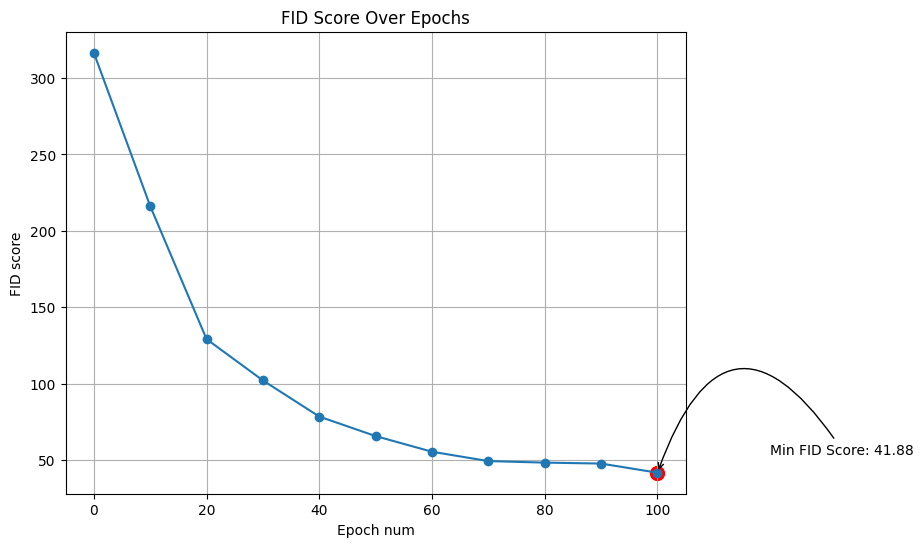

81/81 [==============================] - 28s 344ms/step - d_loss: -2.6132 - g_loss: 5.3070 - lr: 1.2986e-04
Epoch 102/802
81/81 [==============================] - 11s 139ms/step - d_loss: -2.5010 - g_loss: 4.1497 - lr: 1.2986e-04
Epoch 103/802
81/81 [==============================] - 11s 138ms/step - d_loss: -2.4727 - g_loss: 4.5419 - lr: 1.2986e-04
Epoch 104/802
81/81 [==============================] - 11s 139ms/step - d_loss: -2.5396 - g_loss: 5.8245 - lr: 1.2986e-04
Epoch 105/802
81/81 [==============================] - 11s 138ms/step - d_loss: -2.3948 - g_loss: 7.5273 - lr: 1.2986e-04
Epoch 106/802
81/81 [==============================] - 11s 139ms/step - d_loss: -2.2849 - g_loss: 11.8967 - lr: 1.2986e-04
Epoch 107/802
81/81 [==============================] - 11s 138ms/step - d_loss: -2.4182 - g_loss: 10.6918 - lr: 1.2985e-04
Epoch 108/802
81/81 [==============================] - 11s 138ms/step - d_loss: -2.4416 - g_loss: 9.6047 - lr: 1.2985e-04
Epoch 109/802
81/81 [===============

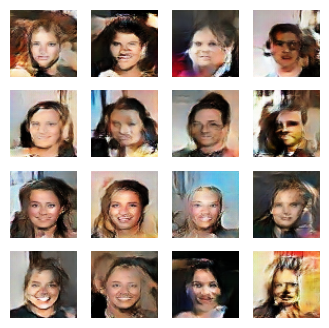

celebGenerated_wgan_110epochs


Output of the calculating FID command:
FID:  40.78428200327426

FID_scores:  [316.47507821040205, 216.20374383495974, 129.22607367736254, 102.20768137194815, 78.58580661913714, 65.83086153118569, 55.60348594285992, 49.4864039567143, 48.49285878374883, 47.864060141217465, 41.88248300089879, 40.78428200327426]
[316.47507821 216.20374383 129.22607368 102.20768137  78.58580662
  65.83086153  55.60348594  49.48640396  48.49285878  47.86406014
  41.882483    40.784282  ]


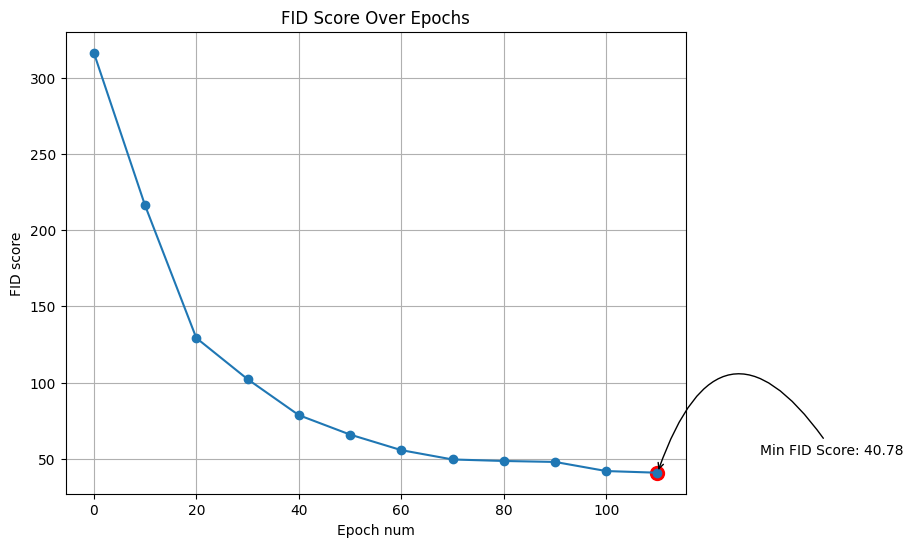

81/81 [==============================] - 28s 347ms/step - d_loss: -2.3822 - g_loss: 9.1327 - lr: 1.2985e-04
Epoch 112/802
81/81 [==============================] - 11s 139ms/step - d_loss: -2.2261 - g_loss: 9.7479 - lr: 1.2985e-04
Epoch 113/802
81/81 [==============================] - 11s 138ms/step - d_loss: -2.4349 - g_loss: 10.9789 - lr: 1.2985e-04
Epoch 114/802
81/81 [==============================] - 11s 138ms/step - d_loss: -2.2645 - g_loss: 11.0893 - lr: 1.2985e-04
Epoch 115/802
81/81 [==============================] - 11s 139ms/step - d_loss: -2.2267 - g_loss: 10.3269 - lr: 1.2984e-04
Epoch 116/802
81/81 [==============================] - 11s 139ms/step - d_loss: -2.1769 - g_loss: 9.7408 - lr: 1.2984e-04
Epoch 117/802
81/81 [==============================] - 11s 138ms/step - d_loss: -2.2624 - g_loss: 9.3744 - lr: 1.2984e-04
Epoch 118/802
81/81 [==============================] - 11s 138ms/step - d_loss: -2.2614 - g_loss: 15.1148 - lr: 1.2984e-04
Epoch 119/802
81/81 [=============

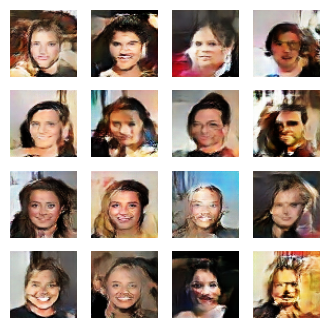

celebGenerated_wgan_120epochs


Output of the calculating FID command:
FID:  40.24305919161512

FID_scores:  [316.47507821040205, 216.20374383495974, 129.22607367736254, 102.20768137194815, 78.58580661913714, 65.83086153118569, 55.60348594285992, 49.4864039567143, 48.49285878374883, 47.864060141217465, 41.88248300089879, 40.78428200327426, 40.24305919161512]
[316.47507821 216.20374383 129.22607368 102.20768137  78.58580662
  65.83086153  55.60348594  49.48640396  48.49285878  47.86406014
  41.882483    40.784282    40.24305919]


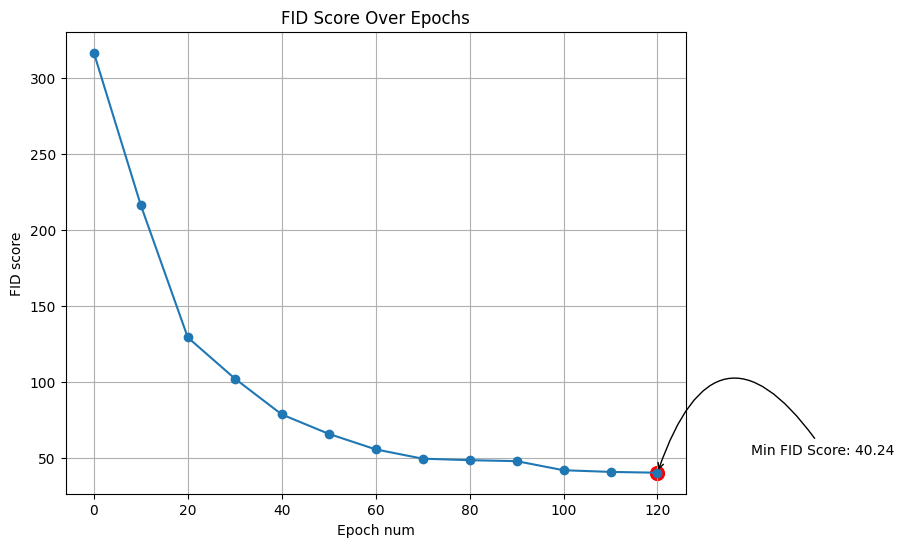

81/81 [==============================] - 28s 345ms/step - d_loss: -2.0677 - g_loss: 15.1831 - lr: 1.2984e-04
Epoch 122/802
81/81 [==============================] - 11s 139ms/step - d_loss: -2.1197 - g_loss: 16.6391 - lr: 1.2983e-04
Epoch 123/802
81/81 [==============================] - 11s 138ms/step - d_loss: -2.2621 - g_loss: 18.8814 - lr: 1.2983e-04
Epoch 124/802
81/81 [==============================] - 11s 138ms/step - d_loss: -2.1322 - g_loss: 19.0541 - lr: 1.2983e-04
Epoch 125/802
81/81 [==============================] - 11s 138ms/step - d_loss: -2.1015 - g_loss: 19.6838 - lr: 1.2983e-04
Epoch 126/802
81/81 [==============================] - 11s 138ms/step - d_loss: -2.1053 - g_loss: 13.3931 - lr: 1.2983e-04
Epoch 127/802
81/81 [==============================] - 11s 138ms/step - d_loss: -2.1013 - g_loss: 15.2605 - lr: 1.2983e-04
Epoch 128/802
81/81 [==============================] - 11s 139ms/step - d_loss: -1.9606 - g_loss: 16.5011 - lr: 1.2983e-04
Epoch 129/802
81/81 [=========

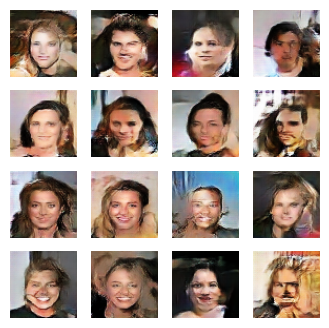

celebGenerated_wgan_130epochs


Output of the calculating FID command:
FID:  38.00545591635256

FID_scores:  [316.47507821040205, 216.20374383495974, 129.22607367736254, 102.20768137194815, 78.58580661913714, 65.83086153118569, 55.60348594285992, 49.4864039567143, 48.49285878374883, 47.864060141217465, 41.88248300089879, 40.78428200327426, 40.24305919161512, 38.00545591635256]
[316.47507821 216.20374383 129.22607368 102.20768137  78.58580662
  65.83086153  55.60348594  49.48640396  48.49285878  47.86406014
  41.882483    40.784282    40.24305919  38.00545592]


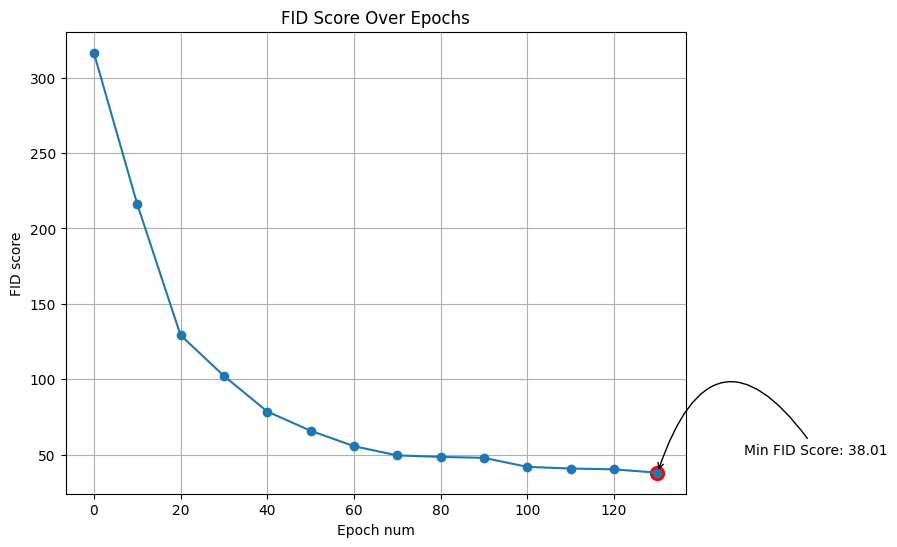

81/81 [==============================] - 28s 344ms/step - d_loss: -2.1230 - g_loss: 15.2924 - lr: 1.2982e-04
Epoch 132/802
81/81 [==============================] - 11s 139ms/step - d_loss: -2.0390 - g_loss: 14.6871 - lr: 1.2982e-04
Epoch 133/802
81/81 [==============================] - 11s 139ms/step - d_loss: -1.9949 - g_loss: 16.0731 - lr: 1.2982e-04
Epoch 134/802
81/81 [==============================] - 11s 139ms/step - d_loss: -2.0864 - g_loss: 15.4203 - lr: 1.2982e-04
Epoch 135/802
81/81 [==============================] - 11s 139ms/step - d_loss: -1.9791 - g_loss: 17.4774 - lr: 1.2982e-04
Epoch 136/802
81/81 [==============================] - 11s 138ms/step - d_loss: -2.1016 - g_loss: 22.5340 - lr: 1.2982e-04
Epoch 137/802
81/81 [==============================] - 11s 138ms/step - d_loss: -2.0006 - g_loss: 21.1279 - lr: 1.2981e-04
Epoch 138/802
81/81 [==============================] - 11s 138ms/step - d_loss: -2.0012 - g_loss: 20.7208 - lr: 1.2981e-04
Epoch 139/802
81/81 [=========

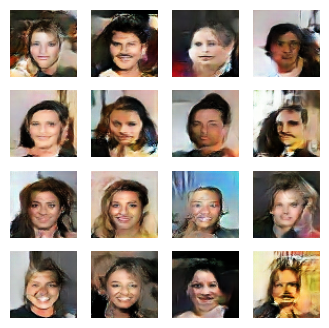

celebGenerated_wgan_140epochs


Output of the calculating FID command:
FID:  38.0377026873787

FID_scores:  [316.47507821040205, 216.20374383495974, 129.22607367736254, 102.20768137194815, 78.58580661913714, 65.83086153118569, 55.60348594285992, 49.4864039567143, 48.49285878374883, 47.864060141217465, 41.88248300089879, 40.78428200327426, 40.24305919161512, 38.00545591635256, 38.0377026873787]
[316.47507821 216.20374383 129.22607368 102.20768137  78.58580662
  65.83086153  55.60348594  49.48640396  48.49285878  47.86406014
  41.882483    40.784282    40.24305919  38.00545592  38.03770269]


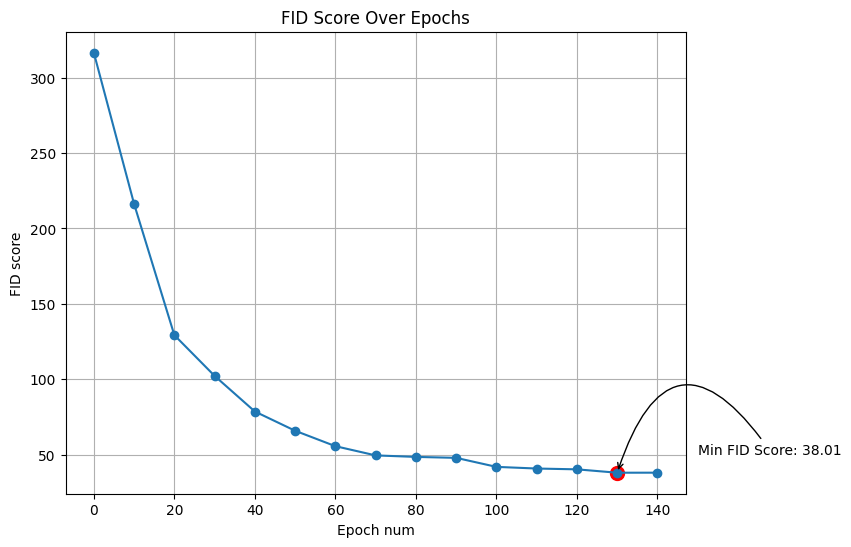

81/81 [==============================] - 28s 345ms/step - d_loss: -1.9332 - g_loss: 23.8290 - lr: 1.2981e-04
Epoch 142/802
81/81 [==============================] - 11s 139ms/step - d_loss: -1.8494 - g_loss: 19.3174 - lr: 1.2981e-04
Epoch 143/802
81/81 [==============================] - 11s 139ms/step - d_loss: -1.9008 - g_loss: 19.8710 - lr: 1.2981e-04
Epoch 144/802
81/81 [==============================] - 11s 138ms/step - d_loss: -1.8587 - g_loss: 21.0631 - lr: 1.2980e-04
Epoch 145/802
81/81 [==============================] - 11s 139ms/step - d_loss: -1.8422 - g_loss: 17.4707 - lr: 1.2980e-04
Epoch 146/802
81/81 [==============================] - 11s 138ms/step - d_loss: -1.8194 - g_loss: 18.3094 - lr: 1.2980e-04
Epoch 147/802
81/81 [==============================] - 11s 139ms/step - d_loss: -1.8965 - g_loss: 19.1037 - lr: 1.2980e-04
Epoch 148/802
81/81 [==============================] - 11s 139ms/step - d_loss: -1.7966 - g_loss: 19.1092 - lr: 1.2980e-04
Epoch 149/802
81/81 [=========

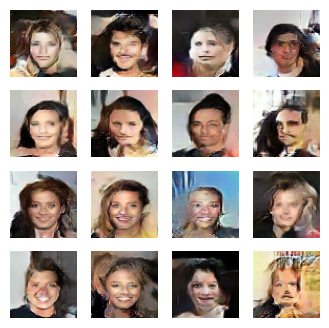

celebGenerated_wgan_150epochs


Output of the calculating FID command:
FID:  38.55267289835865

FID_scores:  [316.47507821040205, 216.20374383495974, 129.22607367736254, 102.20768137194815, 78.58580661913714, 65.83086153118569, 55.60348594285992, 49.4864039567143, 48.49285878374883, 47.864060141217465, 41.88248300089879, 40.78428200327426, 40.24305919161512, 38.00545591635256, 38.0377026873787, 38.55267289835865]
[316.47507821 216.20374383 129.22607368 102.20768137  78.58580662
  65.83086153  55.60348594  49.48640396  48.49285878  47.86406014
  41.882483    40.784282    40.24305919  38.00545592  38.03770269
  38.5526729 ]


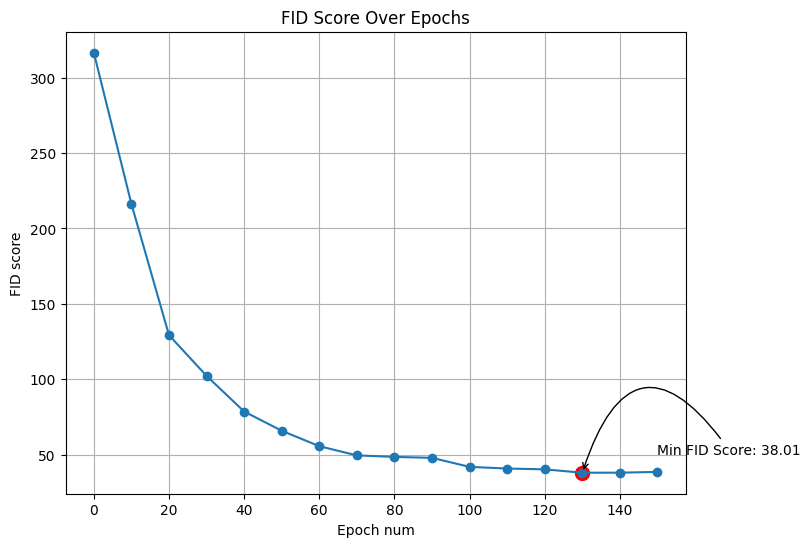

81/81 [==============================] - 28s 350ms/step - d_loss: -1.8970 - g_loss: 18.6130 - lr: 1.2979e-04
Epoch 152/802
81/81 [==============================] - 11s 139ms/step - d_loss: -1.7693 - g_loss: 21.2013 - lr: 1.2979e-04
Epoch 153/802
81/81 [==============================] - 11s 138ms/step - d_loss: -1.8223 - g_loss: 25.7557 - lr: 1.2979e-04
Epoch 154/802
81/81 [==============================] - 11s 139ms/step - d_loss: -1.7396 - g_loss: 24.8861 - lr: 1.2979e-04
Epoch 155/802
81/81 [==============================] - 11s 139ms/step - d_loss: -1.7302 - g_loss: 22.5492 - lr: 1.2979e-04
Epoch 156/802
81/81 [==============================] - 11s 138ms/step - d_loss: -1.7121 - g_loss: 24.3221 - lr: 1.2979e-04
Epoch 157/802
81/81 [==============================] - 11s 139ms/step - d_loss: -1.7497 - g_loss: 19.2732 - lr: 1.2979e-04
Epoch 158/802
81/81 [==============================] - 11s 139ms/step - d_loss: -1.7363 - g_loss: 22.7703 - lr: 1.2979e-04
Epoch 159/802
81/81 [=========

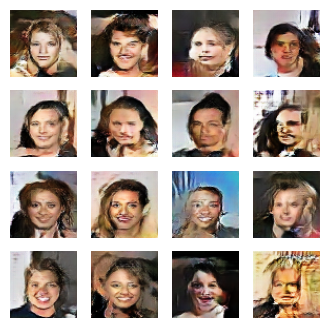

celebGenerated_wgan_160epochs


Output of the calculating FID command:
FID:  40.93918450773219

FID_scores:  [316.47507821040205, 216.20374383495974, 129.22607367736254, 102.20768137194815, 78.58580661913714, 65.83086153118569, 55.60348594285992, 49.4864039567143, 48.49285878374883, 47.864060141217465, 41.88248300089879, 40.78428200327426, 40.24305919161512, 38.00545591635256, 38.0377026873787, 38.55267289835865, 40.93918450773219]
[316.47507821 216.20374383 129.22607368 102.20768137  78.58580662
  65.83086153  55.60348594  49.48640396  48.49285878  47.86406014
  41.882483    40.784282    40.24305919  38.00545592  38.03770269
  38.5526729   40.93918451]


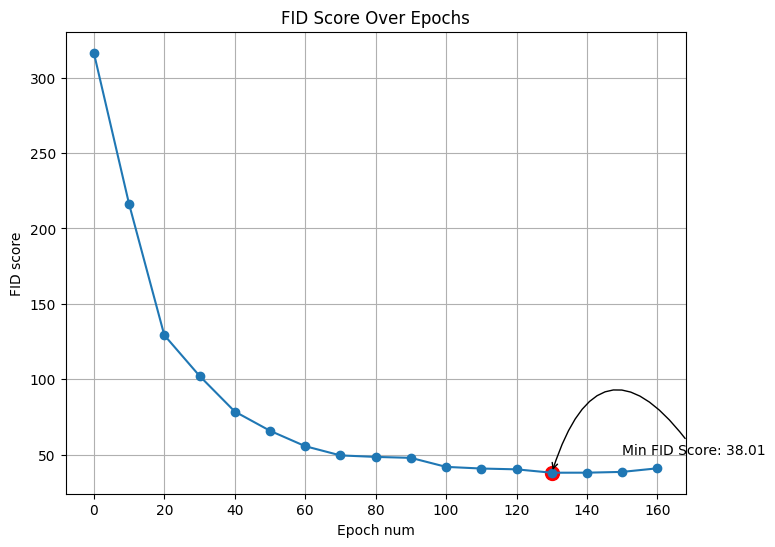

81/81 [==============================] - 28s 345ms/step - d_loss: -1.7838 - g_loss: 18.3926 - lr: 1.2978e-04
Epoch 162/802
81/81 [==============================] - 11s 139ms/step - d_loss: -1.7464 - g_loss: 19.5318 - lr: 1.2978e-04
Epoch 163/802
81/81 [==============================] - 11s 139ms/step - d_loss: -1.6912 - g_loss: 19.9009 - lr: 1.2978e-04
Epoch 164/802
81/81 [==============================] - 11s 138ms/step - d_loss: -1.7666 - g_loss: 19.8017 - lr: 1.2978e-04
Epoch 165/802
81/81 [==============================] - 11s 138ms/step - d_loss: -1.7415 - g_loss: 17.5230 - lr: 1.2978e-04
Epoch 166/802
81/81 [==============================] - 11s 138ms/step - d_loss: -1.7481 - g_loss: 18.8339 - lr: 1.2977e-04
Epoch 167/802
81/81 [==============================] - 11s 139ms/step - d_loss: -1.7550 - g_loss: 20.1759 - lr: 1.2977e-04
Epoch 168/802
81/81 [==============================] - 11s 138ms/step - d_loss: -1.6479 - g_loss: 17.8760 - lr: 1.2977e-04
Epoch 169/802
81/81 [=========

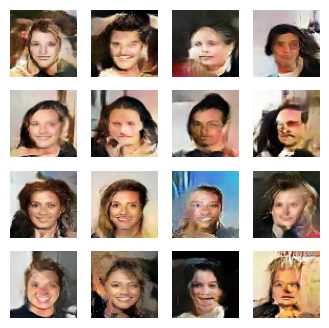

celebGenerated_wgan_170epochs


Output of the calculating FID command:
FID:  34.060376542034646

FID_scores:  [316.47507821040205, 216.20374383495974, 129.22607367736254, 102.20768137194815, 78.58580661913714, 65.83086153118569, 55.60348594285992, 49.4864039567143, 48.49285878374883, 47.864060141217465, 41.88248300089879, 40.78428200327426, 40.24305919161512, 38.00545591635256, 38.0377026873787, 38.55267289835865, 40.93918450773219, 34.060376542034646]
[316.47507821 216.20374383 129.22607368 102.20768137  78.58580662
  65.83086153  55.60348594  49.48640396  48.49285878  47.86406014
  41.882483    40.784282    40.24305919  38.00545592  38.03770269
  38.5526729   40.93918451  34.06037654]


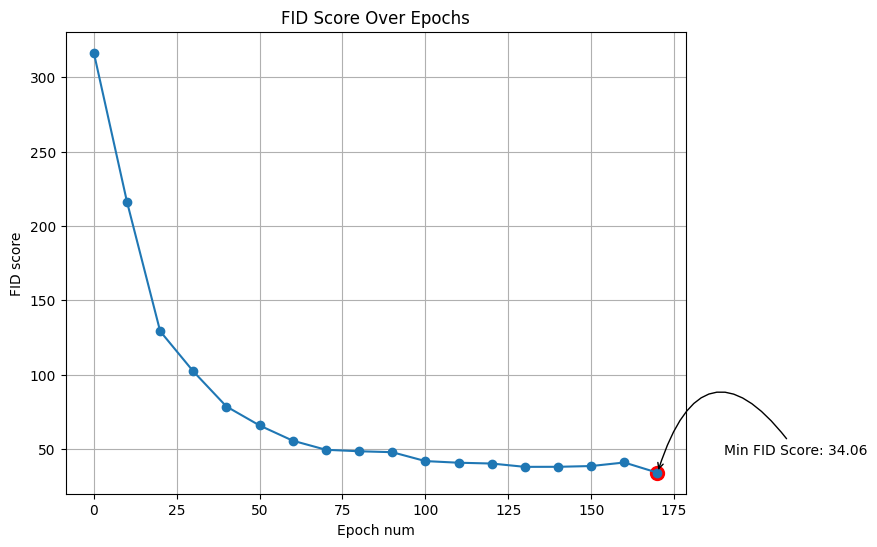

81/81 [==============================] - 28s 352ms/step - d_loss: -1.6707 - g_loss: 20.7853 - lr: 1.2977e-04
Epoch 172/802
81/81 [==============================] - 11s 139ms/step - d_loss: -1.7410 - g_loss: 22.0498 - lr: 1.2977e-04
Epoch 173/802
81/81 [==============================] - 11s 139ms/step - d_loss: -1.6900 - g_loss: 23.8014 - lr: 1.2976e-04
Epoch 174/802
81/81 [==============================] - 11s 139ms/step - d_loss: -1.6667 - g_loss: 21.9689 - lr: 1.2976e-04
Epoch 175/802
81/81 [==============================] - 11s 139ms/step - d_loss: -1.6373 - g_loss: 24.1927 - lr: 1.2976e-04
Epoch 176/802
81/81 [==============================] - 11s 139ms/step - d_loss: -1.5908 - g_loss: 24.7795 - lr: 1.2976e-04
Epoch 177/802
81/81 [==============================] - 11s 139ms/step - d_loss: -1.5654 - g_loss: 22.7902 - lr: 1.2976e-04
Epoch 178/802
81/81 [==============================] - 11s 139ms/step - d_loss: -1.6814 - g_loss: 25.8336 - lr: 1.2976e-04
Epoch 179/802
81/81 [=========

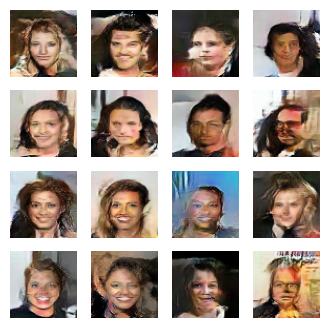

celebGenerated_wgan_180epochs


Output of the calculating FID command:
FID:  35.29705770185308

FID_scores:  [316.47507821040205, 216.20374383495974, 129.22607367736254, 102.20768137194815, 78.58580661913714, 65.83086153118569, 55.60348594285992, 49.4864039567143, 48.49285878374883, 47.864060141217465, 41.88248300089879, 40.78428200327426, 40.24305919161512, 38.00545591635256, 38.0377026873787, 38.55267289835865, 40.93918450773219, 34.060376542034646, 35.29705770185308]
[316.47507821 216.20374383 129.22607368 102.20768137  78.58580662
  65.83086153  55.60348594  49.48640396  48.49285878  47.86406014
  41.882483    40.784282    40.24305919  38.00545592  38.03770269
  38.5526729   40.93918451  34.06037654  35.2970577 ]


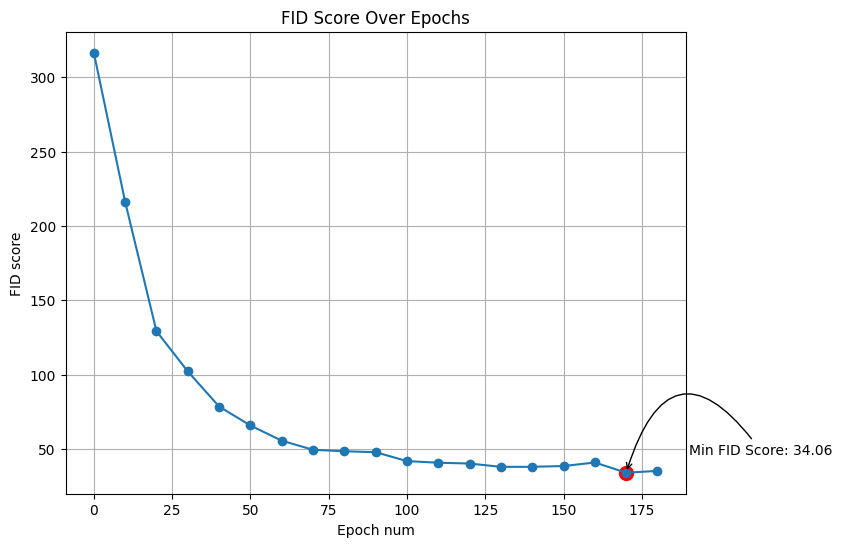

81/81 [==============================] - 29s 354ms/step - d_loss: -1.5520 - g_loss: 28.1325 - lr: 1.2975e-04
Epoch 182/802
81/81 [==============================] - 11s 139ms/step - d_loss: -1.6224 - g_loss: 27.4953 - lr: 1.2975e-04
Epoch 183/802
81/81 [==============================] - 11s 138ms/step - d_loss: -1.5835 - g_loss: 30.9504 - lr: 1.2975e-04
Epoch 184/802
81/81 [==============================] - 11s 139ms/step - d_loss: -1.5085 - g_loss: 26.2955 - lr: 1.2975e-04
Epoch 185/802
81/81 [==============================] - 11s 139ms/step - d_loss: -1.5289 - g_loss: 24.1543 - lr: 1.2975e-04
Epoch 186/802
81/81 [==============================] - 11s 139ms/step - d_loss: -1.4885 - g_loss: 26.4566 - lr: 1.2975e-04
Epoch 187/802
81/81 [==============================] - 11s 139ms/step - d_loss: -1.6546 - g_loss: 28.5592 - lr: 1.2975e-04
Epoch 188/802
81/81 [==============================] - 11s 140ms/step - d_loss: -1.5587 - g_loss: 26.7313 - lr: 1.2974e-04
Epoch 189/802
81/81 [=========

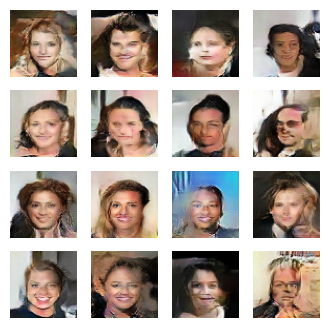

celebGenerated_wgan_190epochs


Output of the calculating FID command:
FID:  35.11420948432951

FID_scores:  [316.47507821040205, 216.20374383495974, 129.22607367736254, 102.20768137194815, 78.58580661913714, 65.83086153118569, 55.60348594285992, 49.4864039567143, 48.49285878374883, 47.864060141217465, 41.88248300089879, 40.78428200327426, 40.24305919161512, 38.00545591635256, 38.0377026873787, 38.55267289835865, 40.93918450773219, 34.060376542034646, 35.29705770185308, 35.11420948432951]
[316.47507821 216.20374383 129.22607368 102.20768137  78.58580662
  65.83086153  55.60348594  49.48640396  48.49285878  47.86406014
  41.882483    40.784282    40.24305919  38.00545592  38.03770269
  38.5526729   40.93918451  34.06037654  35.2970577   35.11420948]


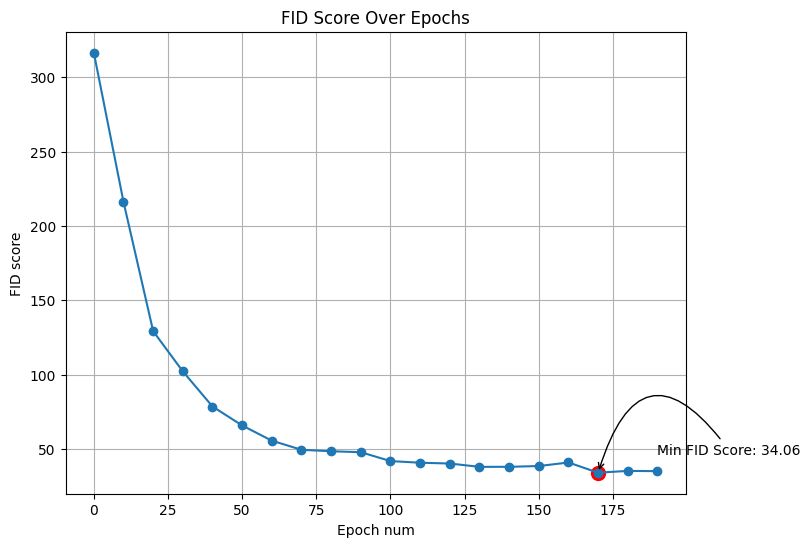

81/81 [==============================] - 29s 359ms/step - d_loss: -1.4835 - g_loss: 30.9555 - lr: 1.2974e-04
Epoch 192/802
81/81 [==============================] - 11s 140ms/step - d_loss: -1.5316 - g_loss: 30.5405 - lr: 1.2974e-04
Epoch 193/802
81/81 [==============================] - 11s 139ms/step - d_loss: -1.5278 - g_loss: 32.0115 - lr: 1.2974e-04
Epoch 194/802
81/81 [==============================] - 11s 139ms/step - d_loss: -1.4929 - g_loss: 32.2923 - lr: 1.2974e-04
Epoch 195/802
81/81 [==============================] - 11s 139ms/step - d_loss: -1.6019 - g_loss: 33.3302 - lr: 1.2973e-04
Epoch 196/802
81/81 [==============================] - 11s 139ms/step - d_loss: -1.4598 - g_loss: 34.5223 - lr: 1.2973e-04
Epoch 197/802
81/81 [==============================] - 11s 140ms/step - d_loss: -1.3898 - g_loss: 35.0949 - lr: 1.2973e-04
Epoch 198/802
81/81 [==============================] - 11s 140ms/step - d_loss: -1.5547 - g_loss: 31.3443 - lr: 1.2973e-04
Epoch 199/802
81/81 [=========

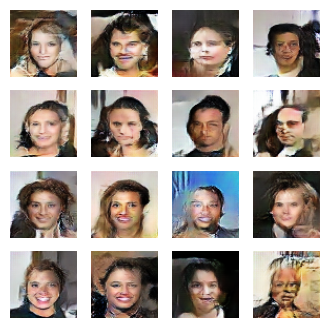

celebGenerated_wgan_200epochs


Output of the calculating FID command:
FID:  34.737326997519745

FID_scores:  [316.47507821040205, 216.20374383495974, 129.22607367736254, 102.20768137194815, 78.58580661913714, 65.83086153118569, 55.60348594285992, 49.4864039567143, 48.49285878374883, 47.864060141217465, 41.88248300089879, 40.78428200327426, 40.24305919161512, 38.00545591635256, 38.0377026873787, 38.55267289835865, 40.93918450773219, 34.060376542034646, 35.29705770185308, 35.11420948432951, 34.737326997519745]
[316.47507821 216.20374383 129.22607368 102.20768137  78.58580662
  65.83086153  55.60348594  49.48640396  48.49285878  47.86406014
  41.882483    40.784282    40.24305919  38.00545592  38.03770269
  38.5526729   40.93918451  34.06037654  35.2970577   35.11420948
  34.737327  ]


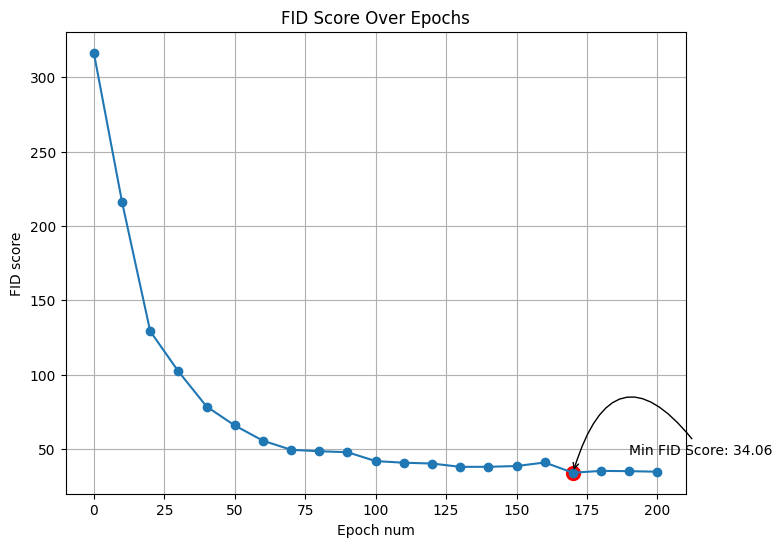

81/81 [==============================] - 29s 355ms/step - d_loss: -1.5235 - g_loss: 30.2192 - lr: 1.2973e-04
Epoch 202/802
81/81 [==============================] - 11s 140ms/step - d_loss: -1.4073 - g_loss: 28.1320 - lr: 1.2972e-04
Epoch 203/802
81/81 [==============================] - 11s 139ms/step - d_loss: -1.4828 - g_loss: 28.8640 - lr: 1.2972e-04
Epoch 204/802
81/81 [==============================] - 11s 139ms/step - d_loss: -1.3600 - g_loss: 24.8907 - lr: 1.2972e-04
Epoch 205/802
81/81 [==============================] - 11s 140ms/step - d_loss: -1.4682 - g_loss: 27.3005 - lr: 1.2972e-04
Epoch 206/802
81/81 [==============================] - 11s 139ms/step - d_loss: -1.5517 - g_loss: 24.3915 - lr: 1.2972e-04
Epoch 207/802
81/81 [==============================] - 11s 140ms/step - d_loss: -1.3184 - g_loss: 25.9615 - lr: 1.2972e-04
Epoch 208/802
81/81 [==============================] - 11s 139ms/step - d_loss: -1.4058 - g_loss: 25.3852 - lr: 1.2972e-04
Epoch 209/802
81/81 [=========

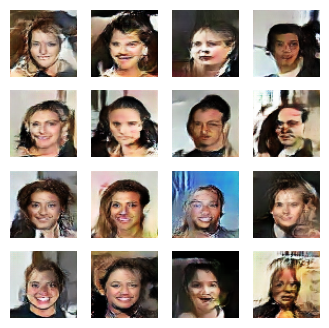

celebGenerated_wgan_210epochs


Output of the calculating FID command:
FID:  37.25998503194009

FID_scores:  [316.47507821040205, 216.20374383495974, 129.22607367736254, 102.20768137194815, 78.58580661913714, 65.83086153118569, 55.60348594285992, 49.4864039567143, 48.49285878374883, 47.864060141217465, 41.88248300089879, 40.78428200327426, 40.24305919161512, 38.00545591635256, 38.0377026873787, 38.55267289835865, 40.93918450773219, 34.060376542034646, 35.29705770185308, 35.11420948432951, 34.737326997519745, 37.25998503194009]
[316.47507821 216.20374383 129.22607368 102.20768137  78.58580662
  65.83086153  55.60348594  49.48640396  48.49285878  47.86406014
  41.882483    40.784282    40.24305919  38.00545592  38.03770269
  38.5526729   40.93918451  34.06037654  35.2970577   35.11420948
  34.737327    37.25998503]


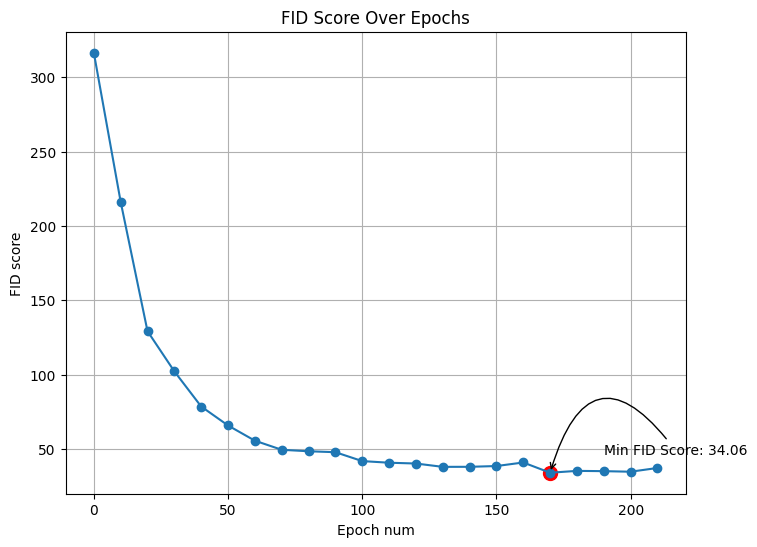

81/81 [==============================] - 29s 353ms/step - d_loss: -1.2854 - g_loss: 19.2017 - lr: 1.2971e-04
Epoch 212/802
81/81 [==============================] - 11s 139ms/step - d_loss: -1.3524 - g_loss: 19.0238 - lr: 1.2971e-04
Epoch 213/802
81/81 [==============================] - 11s 139ms/step - d_loss: -1.3679 - g_loss: 23.0644 - lr: 1.2971e-04
Epoch 214/802
81/81 [==============================] - 11s 139ms/step - d_loss: -1.3926 - g_loss: 22.4576 - lr: 1.2971e-04
Epoch 215/802
81/81 [==============================] - 11s 139ms/step - d_loss: -1.3533 - g_loss: 22.8329 - lr: 1.2971e-04
Epoch 216/802
81/81 [==============================] - 11s 139ms/step - d_loss: -1.3903 - g_loss: 20.4940 - lr: 1.2971e-04
Epoch 217/802
81/81 [==============================] - 11s 139ms/step - d_loss: -1.3017 - g_loss: 17.2514 - lr: 1.2970e-04
Epoch 218/802
81/81 [==============================] - 11s 139ms/step - d_loss: -1.3207 - g_loss: 17.4264 - lr: 1.2970e-04
Epoch 219/802
81/81 [=========

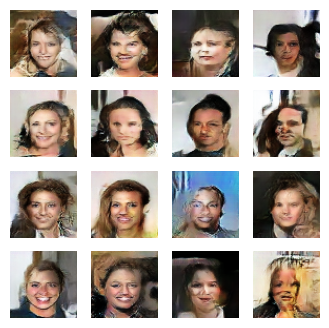

celebGenerated_wgan_220epochs


Output of the calculating FID command:
FID:  33.65796976779555

FID_scores:  [316.47507821040205, 216.20374383495974, 129.22607367736254, 102.20768137194815, 78.58580661913714, 65.83086153118569, 55.60348594285992, 49.4864039567143, 48.49285878374883, 47.864060141217465, 41.88248300089879, 40.78428200327426, 40.24305919161512, 38.00545591635256, 38.0377026873787, 38.55267289835865, 40.93918450773219, 34.060376542034646, 35.29705770185308, 35.11420948432951, 34.737326997519745, 37.25998503194009, 33.65796976779555]
[316.47507821 216.20374383 129.22607368 102.20768137  78.58580662
  65.83086153  55.60348594  49.48640396  48.49285878  47.86406014
  41.882483    40.784282    40.24305919  38.00545592  38.03770269
  38.5526729   40.93918451  34.06037654  35.2970577   35.11420948
  34.737327    37.25998503  33.65796977]


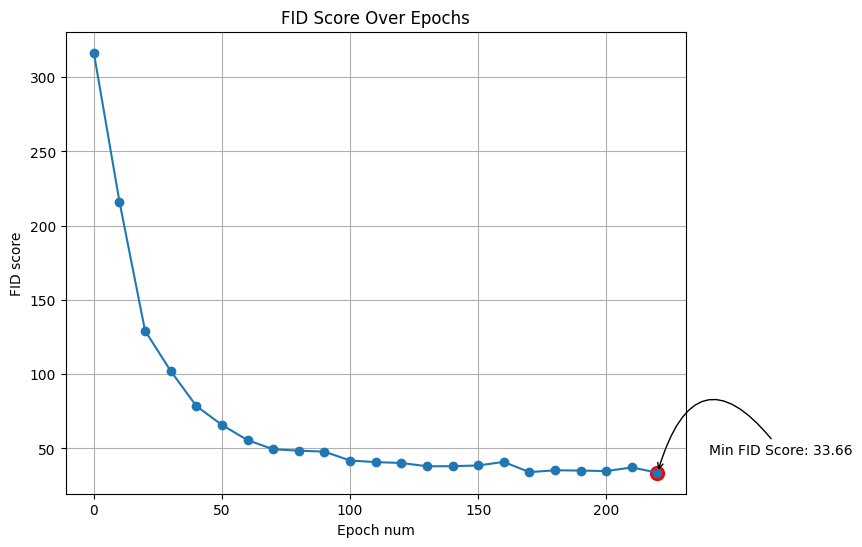

81/81 [==============================] - 29s 355ms/step - d_loss: -1.3178 - g_loss: 10.1503 - lr: 1.2970e-04
Epoch 222/802
81/81 [==============================] - 11s 139ms/step - d_loss: -1.2486 - g_loss: 13.2151 - lr: 1.2970e-04
Epoch 223/802
81/81 [==============================] - 11s 139ms/step - d_loss: -1.3477 - g_loss: 13.5475 - lr: 1.2970e-04
Epoch 224/802
81/81 [==============================] - 11s 139ms/step - d_loss: -1.3503 - g_loss: 14.3865 - lr: 1.2969e-04
Epoch 225/802
81/81 [==============================] - 11s 139ms/step - d_loss: -1.2794 - g_loss: 15.4801 - lr: 1.2969e-04
Epoch 226/802
81/81 [==============================] - 11s 139ms/step - d_loss: -1.2654 - g_loss: 16.3611 - lr: 1.2969e-04
Epoch 227/802
81/81 [==============================] - 11s 139ms/step - d_loss: -1.4094 - g_loss: 13.2085 - lr: 1.2969e-04
Epoch 228/802
81/81 [==============================] - 11s 139ms/step - d_loss: -1.2280 - g_loss: 12.5874 - lr: 1.2969e-04
Epoch 229/802
81/81 [=========

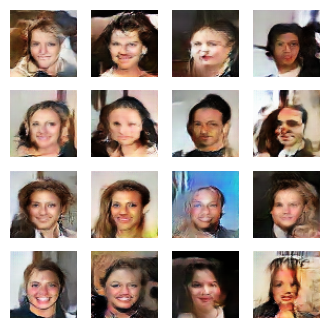

celebGenerated_wgan_230epochs


Output of the calculating FID command:
FID:  33.763977170290445

FID_scores:  [316.47507821040205, 216.20374383495974, 129.22607367736254, 102.20768137194815, 78.58580661913714, 65.83086153118569, 55.60348594285992, 49.4864039567143, 48.49285878374883, 47.864060141217465, 41.88248300089879, 40.78428200327426, 40.24305919161512, 38.00545591635256, 38.0377026873787, 38.55267289835865, 40.93918450773219, 34.060376542034646, 35.29705770185308, 35.11420948432951, 34.737326997519745, 37.25998503194009, 33.65796976779555, 33.763977170290445]
[316.47507821 216.20374383 129.22607368 102.20768137  78.58580662
  65.83086153  55.60348594  49.48640396  48.49285878  47.86406014
  41.882483    40.784282    40.24305919  38.00545592  38.03770269
  38.5526729   40.93918451  34.06037654  35.2970577   35.11420948
  34.737327    37.25998503  33.65796977  33.76397717]


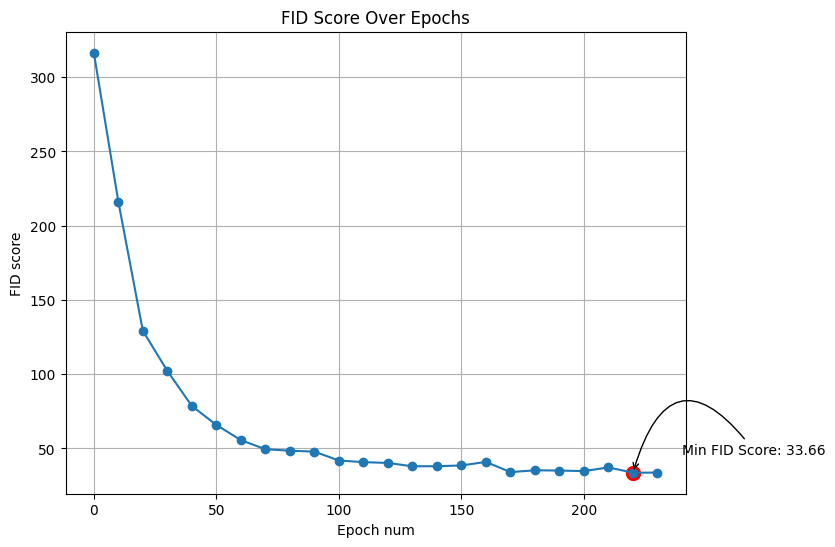

81/81 [==============================] - 29s 353ms/step - d_loss: -1.2536 - g_loss: 12.9884 - lr: 1.2969e-04
Epoch 232/802
81/81 [==============================] - 11s 139ms/step - d_loss: -1.2517 - g_loss: 12.0532 - lr: 1.2968e-04
Epoch 233/802
81/81 [==============================] - 11s 139ms/step - d_loss: -1.2597 - g_loss: 14.7728 - lr: 1.2968e-04
Epoch 234/802
81/81 [==============================] - 11s 139ms/step - d_loss: -1.2236 - g_loss: 10.2542 - lr: 1.2968e-04
Epoch 235/802
81/81 [==============================] - 11s 139ms/step - d_loss: -1.2954 - g_loss: 9.9298 - lr: 1.2968e-04
Epoch 236/802
81/81 [==============================] - 11s 139ms/step - d_loss: -1.2001 - g_loss: 11.7844 - lr: 1.2968e-04
Epoch 237/802
81/81 [==============================] - 11s 139ms/step - d_loss: -1.1915 - g_loss: 12.5014 - lr: 1.2968e-04
Epoch 238/802
81/81 [==============================] - 11s 139ms/step - d_loss: -1.2165 - g_loss: 5.6337 - lr: 1.2968e-04
Epoch 239/802
81/81 [===========

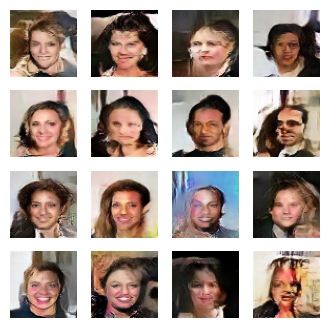

celebGenerated_wgan_240epochs


Output of the calculating FID command:
FID:  32.65655767980459

FID_scores:  [316.47507821040205, 216.20374383495974, 129.22607367736254, 102.20768137194815, 78.58580661913714, 65.83086153118569, 55.60348594285992, 49.4864039567143, 48.49285878374883, 47.864060141217465, 41.88248300089879, 40.78428200327426, 40.24305919161512, 38.00545591635256, 38.0377026873787, 38.55267289835865, 40.93918450773219, 34.060376542034646, 35.29705770185308, 35.11420948432951, 34.737326997519745, 37.25998503194009, 33.65796976779555, 33.763977170290445, 32.65655767980459]
[316.47507821 216.20374383 129.22607368 102.20768137  78.58580662
  65.83086153  55.60348594  49.48640396  48.49285878  47.86406014
  41.882483    40.784282    40.24305919  38.00545592  38.03770269
  38.5526729   40.93918451  34.06037654  35.2970577   35.11420948
  34.737327    37.25998503  33.65796977  33.76397717  32.65655768]


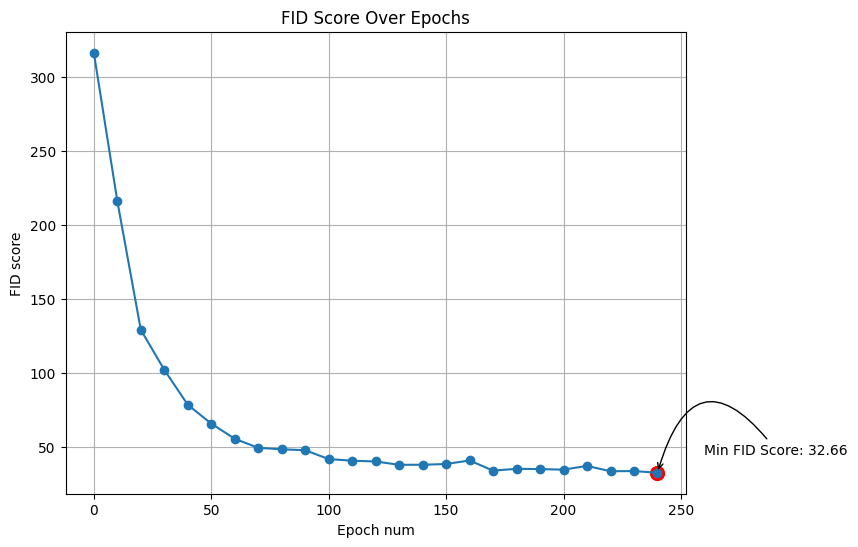

81/81 [==============================] - 29s 358ms/step - d_loss: -1.1794 - g_loss: 16.2910 - lr: 1.2967e-04
Epoch 242/802
81/81 [==============================] - 11s 139ms/step - d_loss: -1.2856 - g_loss: 15.5199 - lr: 1.2967e-04
Epoch 243/802
81/81 [==============================] - 11s 139ms/step - d_loss: -1.1909 - g_loss: 16.7886 - lr: 1.2967e-04
Epoch 244/802
81/81 [==============================] - 11s 140ms/step - d_loss: -1.2293 - g_loss: 16.2043 - lr: 1.2967e-04
Epoch 245/802
81/81 [==============================] - 11s 139ms/step - d_loss: -1.1849 - g_loss: 14.6227 - lr: 1.2967e-04
Epoch 246/802
81/81 [==============================] - 11s 139ms/step - d_loss: -1.1315 - g_loss: 18.7451 - lr: 1.2966e-04
Epoch 247/802
81/81 [==============================] - 11s 139ms/step - d_loss: -1.1511 - g_loss: 18.3874 - lr: 1.2966e-04
Epoch 248/802
81/81 [==============================] - 11s 139ms/step - d_loss: -1.1661 - g_loss: 17.9032 - lr: 1.2966e-04
Epoch 249/802
81/81 [=========

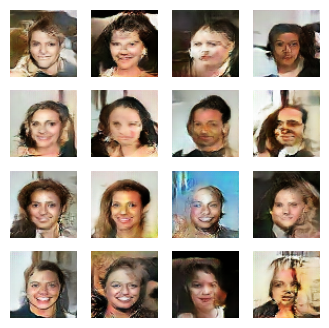

celebGenerated_wgan_250epochs


Output of the calculating FID command:
FID:  35.68222295527562

FID_scores:  [316.47507821040205, 216.20374383495974, 129.22607367736254, 102.20768137194815, 78.58580661913714, 65.83086153118569, 55.60348594285992, 49.4864039567143, 48.49285878374883, 47.864060141217465, 41.88248300089879, 40.78428200327426, 40.24305919161512, 38.00545591635256, 38.0377026873787, 38.55267289835865, 40.93918450773219, 34.060376542034646, 35.29705770185308, 35.11420948432951, 34.737326997519745, 37.25998503194009, 33.65796976779555, 33.763977170290445, 32.65655767980459, 35.68222295527562]
[316.47507821 216.20374383 129.22607368 102.20768137  78.58580662
  65.83086153  55.60348594  49.48640396  48.49285878  47.86406014
  41.882483    40.784282    40.24305919  38.00545592  38.03770269
  38.5526729   40.93918451  34.06037654  35.2970577   35.11420948
  34.737327    37.25998503  33.65796977  33.76397717  32.65655768
  35.68222296]


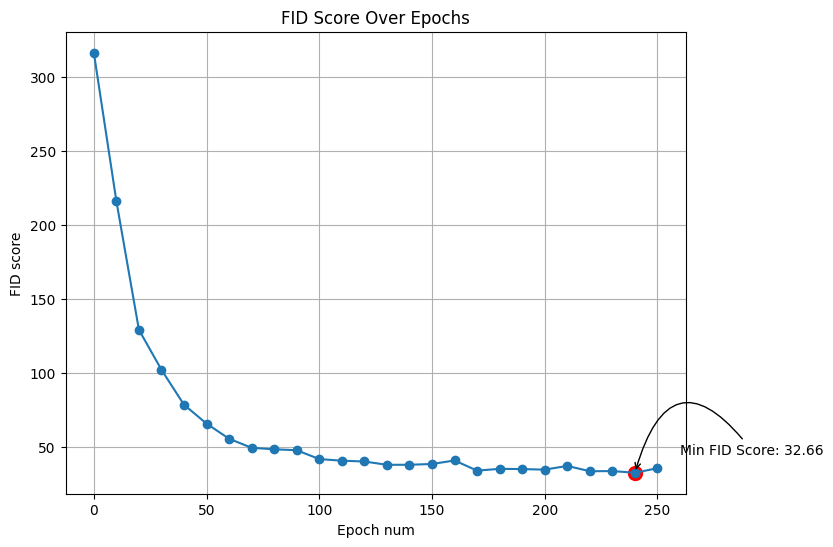

81/81 [==============================] - 29s 355ms/step - d_loss: -1.1533 - g_loss: 22.1174 - lr: 1.2966e-04
Epoch 252/802
81/81 [==============================] - 11s 139ms/step - d_loss: -1.1687 - g_loss: 21.3664 - lr: 1.2966e-04
Epoch 253/802
81/81 [==============================] - 11s 139ms/step - d_loss: -1.1718 - g_loss: 23.4618 - lr: 1.2966e-04
Epoch 254/802
81/81 [==============================] - 11s 139ms/step - d_loss: -1.1501 - g_loss: 25.0297 - lr: 1.2965e-04
Epoch 255/802
81/81 [==============================] - 11s 139ms/step - d_loss: -1.1480 - g_loss: 21.2060 - lr: 1.2965e-04
Epoch 256/802
81/81 [==============================] - 11s 139ms/step - d_loss: -1.2586 - g_loss: 21.4281 - lr: 1.2965e-04
Epoch 257/802
81/81 [==============================] - 11s 139ms/step - d_loss: -1.1839 - g_loss: 22.2652 - lr: 1.2965e-04
Epoch 258/802
81/81 [==============================] - 11s 139ms/step - d_loss: -1.1427 - g_loss: 23.3697 - lr: 1.2965e-04
Epoch 259/802
81/81 [=========

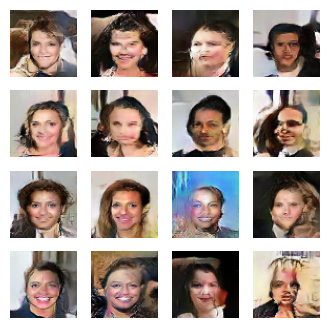

celebGenerated_wgan_260epochs


Output of the calculating FID command:
FID:  34.60038044214514

FID_scores:  [316.47507821040205, 216.20374383495974, 129.22607367736254, 102.20768137194815, 78.58580661913714, 65.83086153118569, 55.60348594285992, 49.4864039567143, 48.49285878374883, 47.864060141217465, 41.88248300089879, 40.78428200327426, 40.24305919161512, 38.00545591635256, 38.0377026873787, 38.55267289835865, 40.93918450773219, 34.060376542034646, 35.29705770185308, 35.11420948432951, 34.737326997519745, 37.25998503194009, 33.65796976779555, 33.763977170290445, 32.65655767980459, 35.68222295527562, 34.60038044214514]
[316.47507821 216.20374383 129.22607368 102.20768137  78.58580662
  65.83086153  55.60348594  49.48640396  48.49285878  47.86406014
  41.882483    40.784282    40.24305919  38.00545592  38.03770269
  38.5526729   40.93918451  34.06037654  35.2970577   35.11420948
  34.737327    37.25998503  33.65796977  33.76397717  32.65655768
  35.68222296  34.60038044]


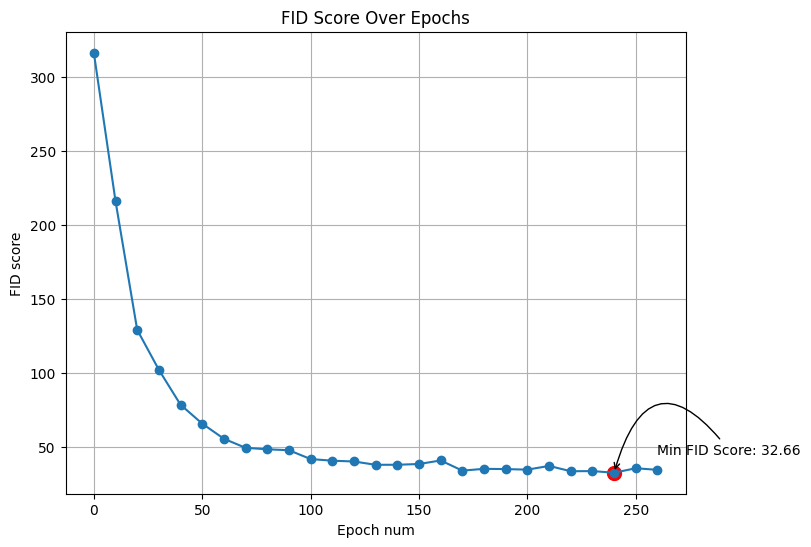

81/81 [==============================] - 29s 354ms/step - d_loss: -1.1654 - g_loss: 19.6435 - lr: 1.2964e-04
Epoch 262/802
81/81 [==============================] - 11s 139ms/step - d_loss: -1.0904 - g_loss: 14.0425 - lr: 1.2964e-04
Epoch 263/802
81/81 [==============================] - 11s 139ms/step - d_loss: -1.1724 - g_loss: 18.2625 - lr: 1.2964e-04
Epoch 264/802
81/81 [==============================] - 11s 139ms/step - d_loss: -1.1815 - g_loss: 14.6548 - lr: 1.2964e-04
Epoch 265/802
81/81 [==============================] - 11s 139ms/step - d_loss: -1.0391 - g_loss: 21.6165 - lr: 1.2964e-04
Epoch 266/802
81/81 [==============================] - 11s 139ms/step - d_loss: -1.1311 - g_loss: 15.6148 - lr: 1.2964e-04
Epoch 267/802
81/81 [==============================] - 11s 139ms/step - d_loss: -1.0895 - g_loss: 16.7881 - lr: 1.2964e-04
Epoch 268/802
81/81 [==============================] - 11s 139ms/step - d_loss: -1.0713 - g_loss: 17.0779 - lr: 1.2963e-04
Epoch 269/802
81/81 [=========

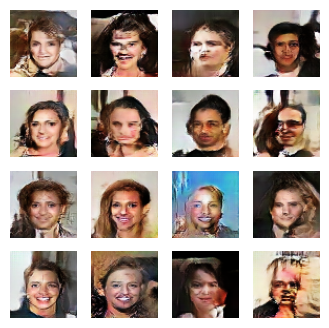

celebGenerated_wgan_270epochs


Output of the calculating FID command:
FID:  33.41340459111507

FID_scores:  [316.47507821040205, 216.20374383495974, 129.22607367736254, 102.20768137194815, 78.58580661913714, 65.83086153118569, 55.60348594285992, 49.4864039567143, 48.49285878374883, 47.864060141217465, 41.88248300089879, 40.78428200327426, 40.24305919161512, 38.00545591635256, 38.0377026873787, 38.55267289835865, 40.93918450773219, 34.060376542034646, 35.29705770185308, 35.11420948432951, 34.737326997519745, 37.25998503194009, 33.65796976779555, 33.763977170290445, 32.65655767980459, 35.68222295527562, 34.60038044214514, 33.41340459111507]
[316.47507821 216.20374383 129.22607368 102.20768137  78.58580662
  65.83086153  55.60348594  49.48640396  48.49285878  47.86406014
  41.882483    40.784282    40.24305919  38.00545592  38.03770269
  38.5526729   40.93918451  34.06037654  35.2970577   35.11420948
  34.737327    37.25998503  33.65796977  33.76397717  32.65655768
  35.68222296  34.60038044  33.41340459]


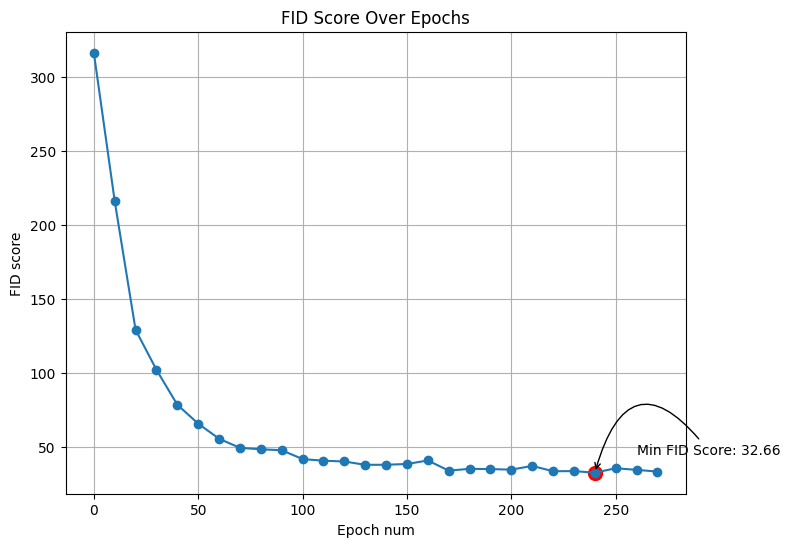

81/81 [==============================] - 29s 356ms/step - d_loss: -1.0752 - g_loss: 16.6855 - lr: 1.2963e-04
Epoch 272/802
81/81 [==============================] - 11s 140ms/step - d_loss: -0.9919 - g_loss: 20.6126 - lr: 1.2963e-04
Epoch 273/802
81/81 [==============================] - 11s 139ms/step - d_loss: -1.0072 - g_loss: 15.9411 - lr: 1.2963e-04
Epoch 274/802
81/81 [==============================] - 11s 139ms/step - d_loss: -1.0561 - g_loss: 23.7382 - lr: 1.2963e-04
Epoch 275/802
81/81 [==============================] - 11s 139ms/step - d_loss: -1.1229 - g_loss: 16.6646 - lr: 1.2963e-04
Epoch 276/802
81/81 [==============================] - 11s 140ms/step - d_loss: -1.0312 - g_loss: 18.3025 - lr: 1.2962e-04
Epoch 277/802
81/81 [==============================] - 11s 139ms/step - d_loss: -1.0710 - g_loss: 24.9047 - lr: 1.2962e-04
Epoch 278/802
81/81 [==============================] - 11s 139ms/step - d_loss: -1.0876 - g_loss: 24.8113 - lr: 1.2962e-04
Epoch 279/802
81/81 [=========

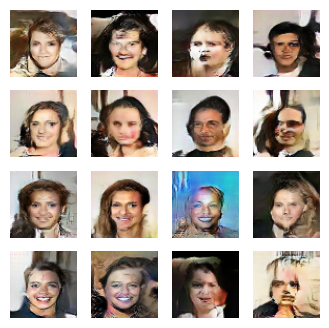

celebGenerated_wgan_280epochs


Output of the calculating FID command:
FID:  35.805250822916946

FID_scores:  [316.47507821040205, 216.20374383495974, 129.22607367736254, 102.20768137194815, 78.58580661913714, 65.83086153118569, 55.60348594285992, 49.4864039567143, 48.49285878374883, 47.864060141217465, 41.88248300089879, 40.78428200327426, 40.24305919161512, 38.00545591635256, 38.0377026873787, 38.55267289835865, 40.93918450773219, 34.060376542034646, 35.29705770185308, 35.11420948432951, 34.737326997519745, 37.25998503194009, 33.65796976779555, 33.763977170290445, 32.65655767980459, 35.68222295527562, 34.60038044214514, 33.41340459111507, 35.805250822916946]
[316.47507821 216.20374383 129.22607368 102.20768137  78.58580662
  65.83086153  55.60348594  49.48640396  48.49285878  47.86406014
  41.882483    40.784282    40.24305919  38.00545592  38.03770269
  38.5526729   40.93918451  34.06037654  35.2970577   35.11420948
  34.737327    37.25998503  33.65796977  33.76397717  32.65655768
  35.68222296  34.60038044  33.41

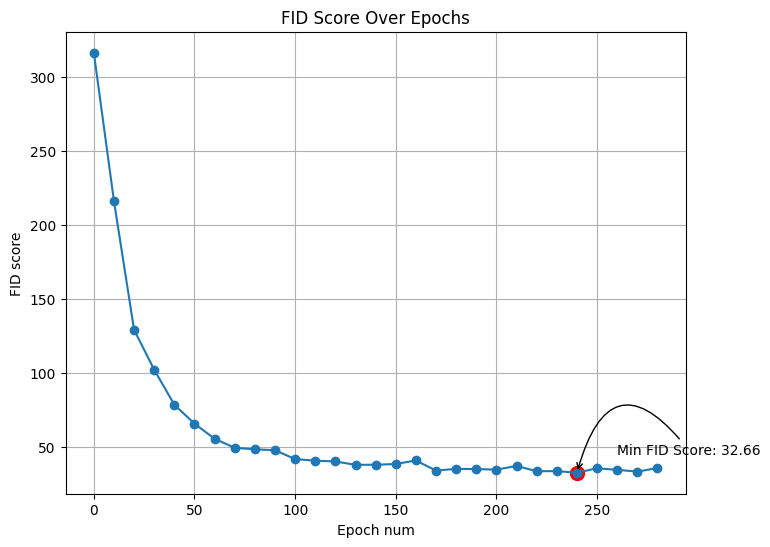

81/81 [==============================] - 29s 362ms/step - d_loss: -1.0522 - g_loss: 19.5005 - lr: 1.2962e-04
Epoch 282/802
81/81 [==============================] - 11s 140ms/step - d_loss: -1.1006 - g_loss: 22.0025 - lr: 1.2962e-04
Epoch 283/802
81/81 [==============================] - 11s 140ms/step - d_loss: -1.0422 - g_loss: 23.1214 - lr: 1.2961e-04
Epoch 284/802
81/81 [==============================] - 11s 139ms/step - d_loss: -1.0805 - g_loss: 23.0894 - lr: 1.2961e-04
Epoch 285/802
81/81 [==============================] - 11s 139ms/step - d_loss: -1.0611 - g_loss: 23.1706 - lr: 1.2961e-04
Epoch 286/802
81/81 [==============================] - 11s 139ms/step - d_loss: -1.0164 - g_loss: 24.5278 - lr: 1.2961e-04
Epoch 287/802
81/81 [==============================] - 11s 139ms/step - d_loss: -1.0971 - g_loss: 19.3946 - lr: 1.2961e-04
Epoch 288/802
81/81 [==============================] - 11s 139ms/step - d_loss: -0.9661 - g_loss: 20.4050 - lr: 1.2961e-04
Epoch 289/802
81/81 [=========

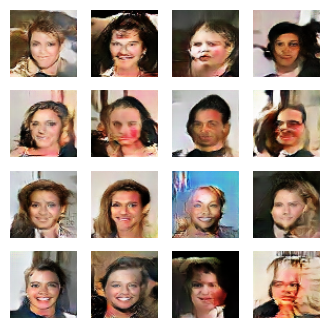

celebGenerated_wgan_290epochs


Output of the calculating FID command:
FID:  30.006506236729848

FID_scores:  [316.47507821040205, 216.20374383495974, 129.22607367736254, 102.20768137194815, 78.58580661913714, 65.83086153118569, 55.60348594285992, 49.4864039567143, 48.49285878374883, 47.864060141217465, 41.88248300089879, 40.78428200327426, 40.24305919161512, 38.00545591635256, 38.0377026873787, 38.55267289835865, 40.93918450773219, 34.060376542034646, 35.29705770185308, 35.11420948432951, 34.737326997519745, 37.25998503194009, 33.65796976779555, 33.763977170290445, 32.65655767980459, 35.68222295527562, 34.60038044214514, 33.41340459111507, 35.805250822916946, 30.006506236729848]
[316.47507821 216.20374383 129.22607368 102.20768137  78.58580662
  65.83086153  55.60348594  49.48640396  48.49285878  47.86406014
  41.882483    40.784282    40.24305919  38.00545592  38.03770269
  38.5526729   40.93918451  34.06037654  35.2970577   35.11420948
  34.737327    37.25998503  33.65796977  33.76397717  32.65655768
  35.68222296

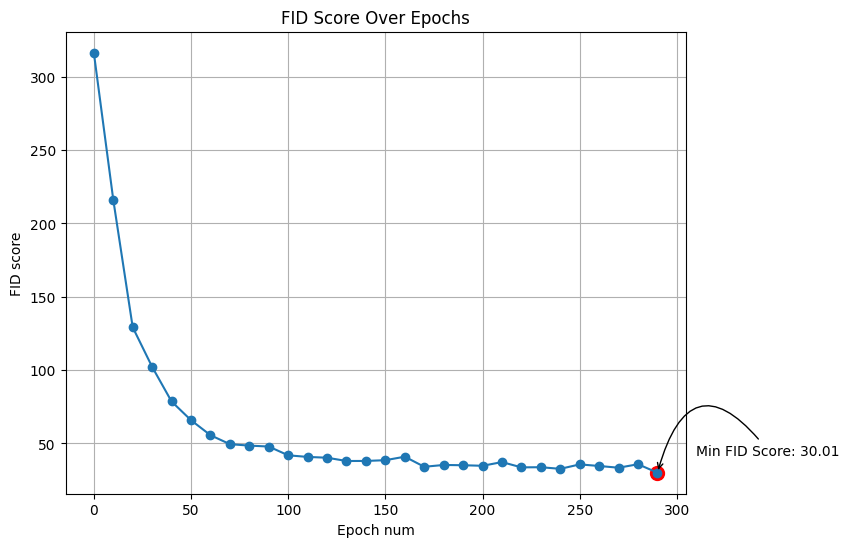

81/81 [==============================] - 29s 365ms/step - d_loss: -1.0840 - g_loss: 19.4926 - lr: 1.2960e-04
Epoch 292/802
81/81 [==============================] - 11s 140ms/step - d_loss: -0.9098 - g_loss: 22.1719 - lr: 1.2960e-04
Epoch 293/802
81/81 [==============================] - 11s 139ms/step - d_loss: -1.0443 - g_loss: 22.6334 - lr: 1.2960e-04
Epoch 294/802
81/81 [==============================] - 11s 139ms/step - d_loss: -0.9495 - g_loss: 18.3074 - lr: 1.2960e-04
Epoch 295/802
81/81 [==============================] - 11s 139ms/step - d_loss: -0.9793 - g_loss: 22.2599 - lr: 1.2960e-04
Epoch 296/802
81/81 [==============================] - 11s 139ms/step - d_loss: -1.0305 - g_loss: 16.0651 - lr: 1.2960e-04
Epoch 297/802
81/81 [==============================] - 11s 139ms/step - d_loss: -0.9825 - g_loss: 22.4354 - lr: 1.2960e-04
Epoch 298/802
81/81 [==============================] - 11s 139ms/step - d_loss: -0.9368 - g_loss: 21.8773 - lr: 1.2959e-04
Epoch 299/802
81/81 [=========

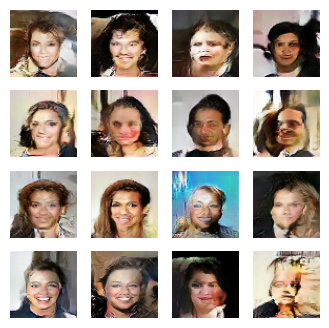

celebGenerated_wgan_300epochs


Output of the calculating FID command:
FID:  32.54669194833767

FID_scores:  [316.47507821040205, 216.20374383495974, 129.22607367736254, 102.20768137194815, 78.58580661913714, 65.83086153118569, 55.60348594285992, 49.4864039567143, 48.49285878374883, 47.864060141217465, 41.88248300089879, 40.78428200327426, 40.24305919161512, 38.00545591635256, 38.0377026873787, 38.55267289835865, 40.93918450773219, 34.060376542034646, 35.29705770185308, 35.11420948432951, 34.737326997519745, 37.25998503194009, 33.65796976779555, 33.763977170290445, 32.65655767980459, 35.68222295527562, 34.60038044214514, 33.41340459111507, 35.805250822916946, 30.006506236729848, 32.54669194833767]
[316.47507821 216.20374383 129.22607368 102.20768137  78.58580662
  65.83086153  55.60348594  49.48640396  48.49285878  47.86406014
  41.882483    40.784282    40.24305919  38.00545592  38.03770269
  38.5526729   40.93918451  34.06037654  35.2970577   35.11420948
  34.737327    37.25998503  33.65796977  33.76397717  32.6565

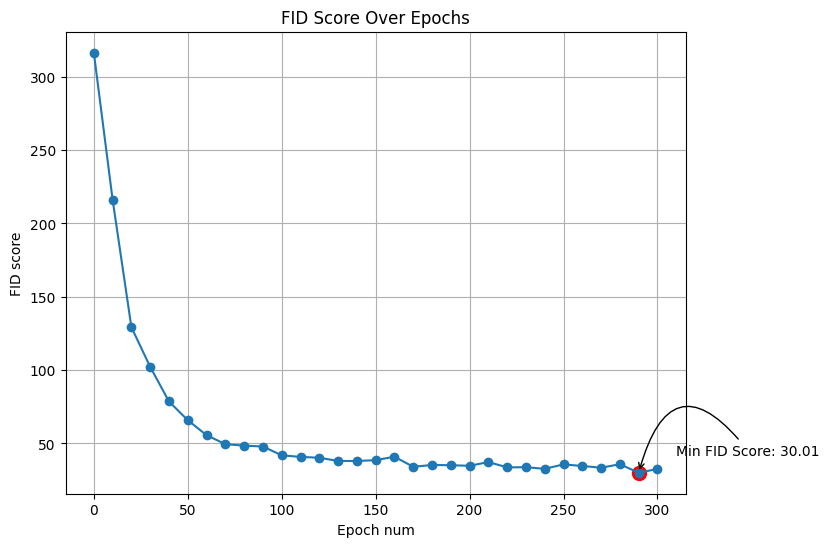

81/81 [==============================] - 29s 361ms/step - d_loss: -0.9664 - g_loss: 21.6603 - lr: 1.2959e-04
Epoch 302/802
81/81 [==============================] - 11s 139ms/step - d_loss: -0.9155 - g_loss: 21.9777 - lr: 1.2959e-04
Epoch 303/802
81/81 [==============================] - 11s 139ms/step - d_loss: -0.9623 - g_loss: 20.8510 - lr: 1.2959e-04
Epoch 304/802
81/81 [==============================] - 11s 139ms/step - d_loss: -1.0154 - g_loss: 22.2669 - lr: 1.2959e-04
Epoch 305/802
81/81 [==============================] - 11s 139ms/step - d_loss: -0.8422 - g_loss: 18.0524 - lr: 1.2958e-04
Epoch 306/802
81/81 [==============================] - 11s 139ms/step - d_loss: -0.8754 - g_loss: 24.3709 - lr: 1.2958e-04
Epoch 307/802
81/81 [==============================] - 11s 139ms/step - d_loss: -0.9017 - g_loss: 30.3328 - lr: 1.2958e-04
Epoch 308/802
81/81 [==============================] - 11s 139ms/step - d_loss: -0.9121 - g_loss: 24.3017 - lr: 1.2958e-04
Epoch 309/802
81/81 [=========

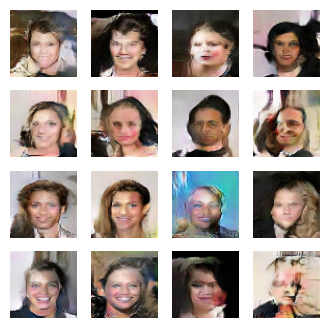

celebGenerated_wgan_310epochs


Output of the calculating FID command:
FID:  36.56077104762397

FID_scores:  [316.47507821040205, 216.20374383495974, 129.22607367736254, 102.20768137194815, 78.58580661913714, 65.83086153118569, 55.60348594285992, 49.4864039567143, 48.49285878374883, 47.864060141217465, 41.88248300089879, 40.78428200327426, 40.24305919161512, 38.00545591635256, 38.0377026873787, 38.55267289835865, 40.93918450773219, 34.060376542034646, 35.29705770185308, 35.11420948432951, 34.737326997519745, 37.25998503194009, 33.65796976779555, 33.763977170290445, 32.65655767980459, 35.68222295527562, 34.60038044214514, 33.41340459111507, 35.805250822916946, 30.006506236729848, 32.54669194833767, 36.56077104762397]
[316.47507821 216.20374383 129.22607368 102.20768137  78.58580662
  65.83086153  55.60348594  49.48640396  48.49285878  47.86406014
  41.882483    40.784282    40.24305919  38.00545592  38.03770269
  38.5526729   40.93918451  34.06037654  35.2970577   35.11420948
  34.737327    37.25998503  33.65796977  3

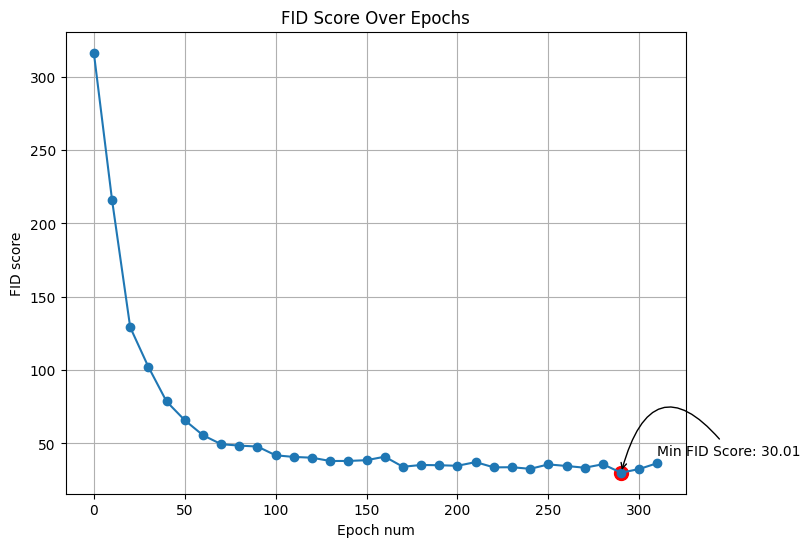

81/81 [==============================] - 29s 365ms/step - d_loss: -0.8799 - g_loss: 20.4230 - lr: 1.2958e-04
Epoch 312/802
81/81 [==============================] - 11s 140ms/step - d_loss: -0.8854 - g_loss: 26.7351 - lr: 1.2957e-04
Epoch 313/802
81/81 [==============================] - 11s 140ms/step - d_loss: -0.9992 - g_loss: 24.5810 - lr: 1.2957e-04
Epoch 314/802
81/81 [==============================] - 11s 140ms/step - d_loss: -0.8354 - g_loss: 21.9169 - lr: 1.2957e-04
Epoch 315/802
81/81 [==============================] - 11s 139ms/step - d_loss: -0.9249 - g_loss: 15.1274 - lr: 1.2957e-04
Epoch 316/802
81/81 [==============================] - 11s 140ms/step - d_loss: -0.7684 - g_loss: 19.3412 - lr: 1.2957e-04
Epoch 317/802
81/81 [==============================] - 11s 139ms/step - d_loss: -0.8005 - g_loss: 26.1244 - lr: 1.2957e-04
Epoch 318/802
81/81 [==============================] - 11s 139ms/step - d_loss: -0.8921 - g_loss: 27.2278 - lr: 1.2957e-04
Epoch 319/802
81/81 [=========

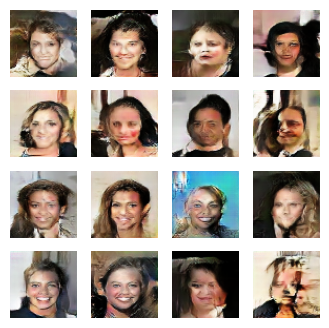

celebGenerated_wgan_320epochs


Output of the calculating FID command:
FID:  33.95565354256044

FID_scores:  [316.47507821040205, 216.20374383495974, 129.22607367736254, 102.20768137194815, 78.58580661913714, 65.83086153118569, 55.60348594285992, 49.4864039567143, 48.49285878374883, 47.864060141217465, 41.88248300089879, 40.78428200327426, 40.24305919161512, 38.00545591635256, 38.0377026873787, 38.55267289835865, 40.93918450773219, 34.060376542034646, 35.29705770185308, 35.11420948432951, 34.737326997519745, 37.25998503194009, 33.65796976779555, 33.763977170290445, 32.65655767980459, 35.68222295527562, 34.60038044214514, 33.41340459111507, 35.805250822916946, 30.006506236729848, 32.54669194833767, 36.56077104762397, 33.95565354256044]
[316.47507821 216.20374383 129.22607368 102.20768137  78.58580662
  65.83086153  55.60348594  49.48640396  48.49285878  47.86406014
  41.882483    40.784282    40.24305919  38.00545592  38.03770269
  38.5526729   40.93918451  34.06037654  35.2970577   35.11420948
  34.737327    37.25998

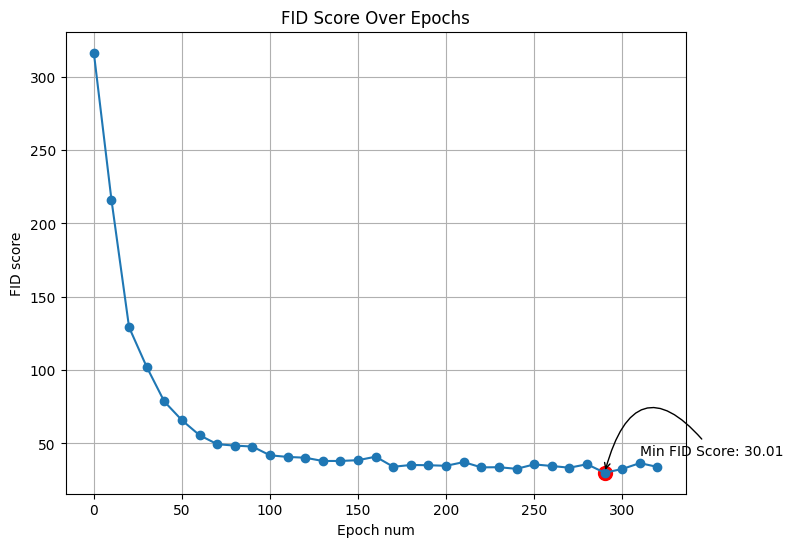

81/81 [==============================] - 30s 369ms/step - d_loss: -0.8431 - g_loss: 24.4593 - lr: 1.2956e-04
Epoch 322/802
81/81 [==============================] - 11s 140ms/step - d_loss: -0.9026 - g_loss: 25.9298 - lr: 1.2956e-04
Epoch 323/802
81/81 [==============================] - 11s 139ms/step - d_loss: -0.8900 - g_loss: 26.5607 - lr: 1.2956e-04
Epoch 324/802
81/81 [==============================] - 11s 140ms/step - d_loss: -0.8118 - g_loss: 26.3109 - lr: 1.2956e-04
Epoch 325/802
81/81 [==============================] - 11s 139ms/step - d_loss: -0.8889 - g_loss: 25.5658 - lr: 1.2956e-04
Epoch 326/802
81/81 [==============================] - 11s 139ms/step - d_loss: -0.7759 - g_loss: 23.7147 - lr: 1.2956e-04
Epoch 327/802
81/81 [==============================] - 11s 140ms/step - d_loss: -0.8426 - g_loss: 25.7074 - lr: 1.2955e-04
Epoch 328/802
81/81 [==============================] - 11s 140ms/step - d_loss: -0.9053 - g_loss: 25.3692 - lr: 1.2955e-04
Epoch 329/802
81/81 [=========

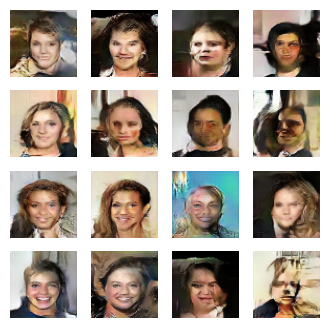

celebGenerated_wgan_330epochs


Output of the calculating FID command:
FID:  32.3356869825586

FID_scores:  [316.47507821040205, 216.20374383495974, 129.22607367736254, 102.20768137194815, 78.58580661913714, 65.83086153118569, 55.60348594285992, 49.4864039567143, 48.49285878374883, 47.864060141217465, 41.88248300089879, 40.78428200327426, 40.24305919161512, 38.00545591635256, 38.0377026873787, 38.55267289835865, 40.93918450773219, 34.060376542034646, 35.29705770185308, 35.11420948432951, 34.737326997519745, 37.25998503194009, 33.65796976779555, 33.763977170290445, 32.65655767980459, 35.68222295527562, 34.60038044214514, 33.41340459111507, 35.805250822916946, 30.006506236729848, 32.54669194833767, 36.56077104762397, 33.95565354256044, 32.3356869825586]
[316.47507821 216.20374383 129.22607368 102.20768137  78.58580662
  65.83086153  55.60348594  49.48640396  48.49285878  47.86406014
  41.882483    40.784282    40.24305919  38.00545592  38.03770269
  38.5526729   40.93918451  34.06037654  35.2970577   35.11420948
  34.7

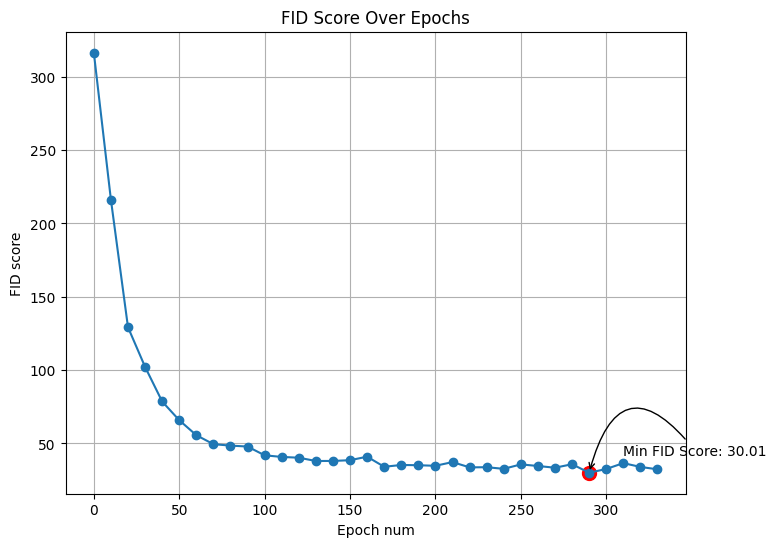

81/81 [==============================] - 30s 368ms/step - d_loss: -0.9012 - g_loss: 24.7717 - lr: 1.2955e-04
Epoch 332/802
81/81 [==============================] - 11s 140ms/step - d_loss: -0.8636 - g_loss: 25.6798 - lr: 1.2955e-04
Epoch 333/802
81/81 [==============================] - 11s 139ms/step - d_loss: -0.9179 - g_loss: 26.8846 - lr: 1.2955e-04
Epoch 334/802
81/81 [==============================] - 11s 139ms/step - d_loss: -0.8611 - g_loss: 22.6747 - lr: 1.2954e-04
Epoch 335/802
81/81 [==============================] - 11s 140ms/step - d_loss: -0.8550 - g_loss: 24.7349 - lr: 1.2954e-04
Epoch 336/802
81/81 [==============================] - 11s 139ms/step - d_loss: -0.8218 - g_loss: 29.4291 - lr: 1.2954e-04
Epoch 337/802
81/81 [==============================] - 11s 139ms/step - d_loss: -0.8134 - g_loss: 28.7056 - lr: 1.2954e-04
Epoch 338/802
81/81 [==============================] - 11s 140ms/step - d_loss: -0.8305 - g_loss: 26.1586 - lr: 1.2954e-04
Epoch 339/802
81/81 [=========

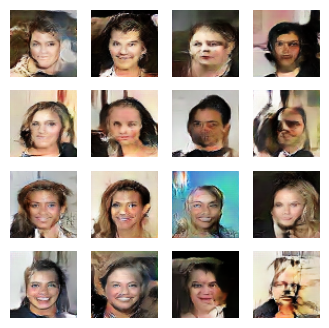

celebGenerated_wgan_340epochs


Output of the calculating FID command:
FID:  31.16579685343882

FID_scores:  [316.47507821040205, 216.20374383495974, 129.22607367736254, 102.20768137194815, 78.58580661913714, 65.83086153118569, 55.60348594285992, 49.4864039567143, 48.49285878374883, 47.864060141217465, 41.88248300089879, 40.78428200327426, 40.24305919161512, 38.00545591635256, 38.0377026873787, 38.55267289835865, 40.93918450773219, 34.060376542034646, 35.29705770185308, 35.11420948432951, 34.737326997519745, 37.25998503194009, 33.65796976779555, 33.763977170290445, 32.65655767980459, 35.68222295527562, 34.60038044214514, 33.41340459111507, 35.805250822916946, 30.006506236729848, 32.54669194833767, 36.56077104762397, 33.95565354256044, 32.3356869825586, 31.16579685343882]
[316.47507821 216.20374383 129.22607368 102.20768137  78.58580662
  65.83086153  55.60348594  49.48640396  48.49285878  47.86406014
  41.882483    40.784282    40.24305919  38.00545592  38.03770269
  38.5526729   40.93918451  34.06037654  35.2970577 

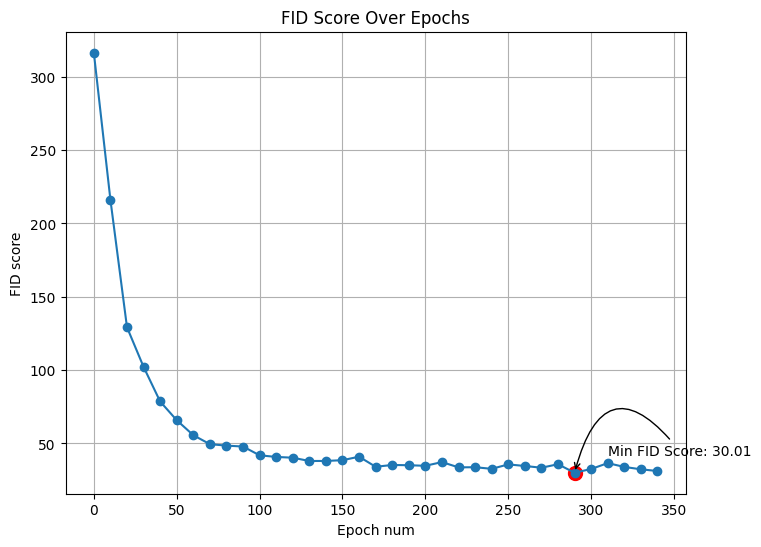

81/81 [==============================] - 30s 365ms/step - d_loss: -0.8406 - g_loss: 25.5883 - lr: 1.2954e-04
Epoch 342/802
81/81 [==============================] - 11s 139ms/step - d_loss: -0.8191 - g_loss: 19.9530 - lr: 1.2953e-04
Epoch 343/802
81/81 [==============================] - 11s 140ms/step - d_loss: -0.7801 - g_loss: 19.1171 - lr: 1.2953e-04
Epoch 344/802
81/81 [==============================] - 11s 140ms/step - d_loss: -0.8200 - g_loss: 24.5896 - lr: 1.2953e-04
Epoch 345/802
81/81 [==============================] - 11s 140ms/step - d_loss: -0.7168 - g_loss: 22.0741 - lr: 1.2953e-04
Epoch 346/802
81/81 [==============================] - 11s 140ms/step - d_loss: -0.7879 - g_loss: 23.7275 - lr: 1.2953e-04
Epoch 347/802
81/81 [==============================] - 11s 140ms/step - d_loss: -0.7723 - g_loss: 24.8130 - lr: 1.2953e-04
Epoch 348/802
81/81 [==============================] - 11s 140ms/step - d_loss: -0.7495 - g_loss: 20.4552 - lr: 1.2953e-04
Epoch 349/802
81/81 [=========

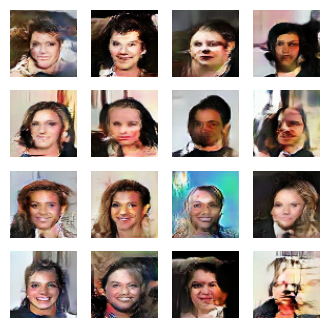

celebGenerated_wgan_350epochs


Output of the calculating FID command:
FID:  32.55062881854036

FID_scores:  [316.47507821040205, 216.20374383495974, 129.22607367736254, 102.20768137194815, 78.58580661913714, 65.83086153118569, 55.60348594285992, 49.4864039567143, 48.49285878374883, 47.864060141217465, 41.88248300089879, 40.78428200327426, 40.24305919161512, 38.00545591635256, 38.0377026873787, 38.55267289835865, 40.93918450773219, 34.060376542034646, 35.29705770185308, 35.11420948432951, 34.737326997519745, 37.25998503194009, 33.65796976779555, 33.763977170290445, 32.65655767980459, 35.68222295527562, 34.60038044214514, 33.41340459111507, 35.805250822916946, 30.006506236729848, 32.54669194833767, 36.56077104762397, 33.95565354256044, 32.3356869825586, 31.16579685343882, 32.55062881854036]
[316.47507821 216.20374383 129.22607368 102.20768137  78.58580662
  65.83086153  55.60348594  49.48640396  48.49285878  47.86406014
  41.882483    40.784282    40.24305919  38.00545592  38.03770269
  38.5526729   40.93918451  34.06

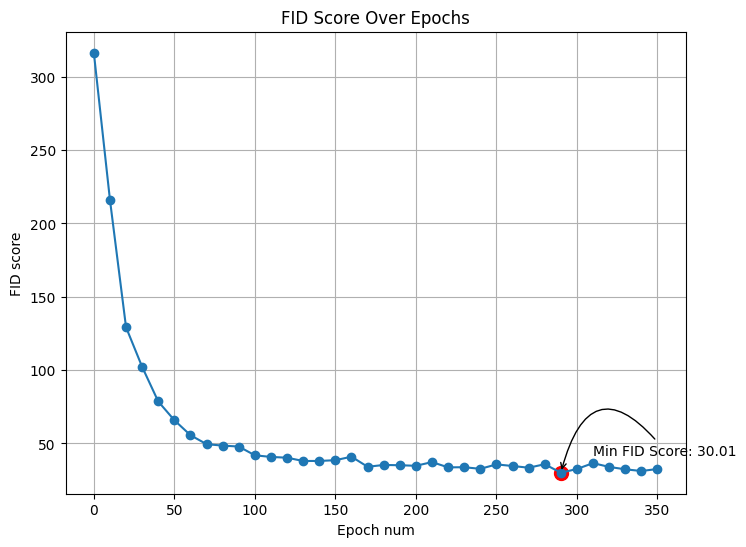

81/81 [==============================] - 29s 361ms/step - d_loss: -0.7754 - g_loss: 21.2069 - lr: 1.2952e-04
Epoch 352/802
81/81 [==============================] - 11s 140ms/step - d_loss: -0.7211 - g_loss: 21.0923 - lr: 1.2952e-04
Epoch 353/802
81/81 [==============================] - 11s 139ms/step - d_loss: -0.7713 - g_loss: 20.6806 - lr: 1.2952e-04
Epoch 354/802
81/81 [==============================] - 11s 139ms/step - d_loss: -0.8186 - g_loss: 16.7465 - lr: 1.2952e-04
Epoch 355/802
81/81 [==============================] - 11s 139ms/step - d_loss: -0.8129 - g_loss: 26.7350 - lr: 1.2952e-04
Epoch 356/802
81/81 [==============================] - 11s 139ms/step - d_loss: -0.6954 - g_loss: 26.8535 - lr: 1.2951e-04
Epoch 357/802
81/81 [==============================] - 11s 139ms/step - d_loss: -0.7839 - g_loss: 20.0518 - lr: 1.2951e-04
Epoch 358/802
81/81 [==============================] - 11s 139ms/step - d_loss: -0.6627 - g_loss: 12.1054 - lr: 1.2951e-04
Epoch 359/802
81/81 [=========

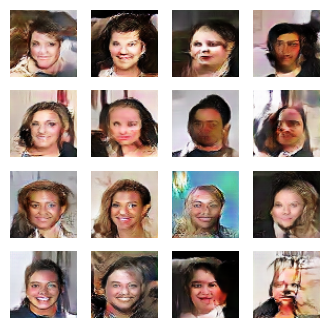

celebGenerated_wgan_360epochs


Output of the calculating FID command:
FID:  28.732366276950188

FID_scores:  [316.47507821040205, 216.20374383495974, 129.22607367736254, 102.20768137194815, 78.58580661913714, 65.83086153118569, 55.60348594285992, 49.4864039567143, 48.49285878374883, 47.864060141217465, 41.88248300089879, 40.78428200327426, 40.24305919161512, 38.00545591635256, 38.0377026873787, 38.55267289835865, 40.93918450773219, 34.060376542034646, 35.29705770185308, 35.11420948432951, 34.737326997519745, 37.25998503194009, 33.65796976779555, 33.763977170290445, 32.65655767980459, 35.68222295527562, 34.60038044214514, 33.41340459111507, 35.805250822916946, 30.006506236729848, 32.54669194833767, 36.56077104762397, 33.95565354256044, 32.3356869825586, 31.16579685343882, 32.55062881854036, 28.732366276950188]
[316.47507821 216.20374383 129.22607368 102.20768137  78.58580662
  65.83086153  55.60348594  49.48640396  48.49285878  47.86406014
  41.882483    40.784282    40.24305919  38.00545592  38.03770269
  38.5526729

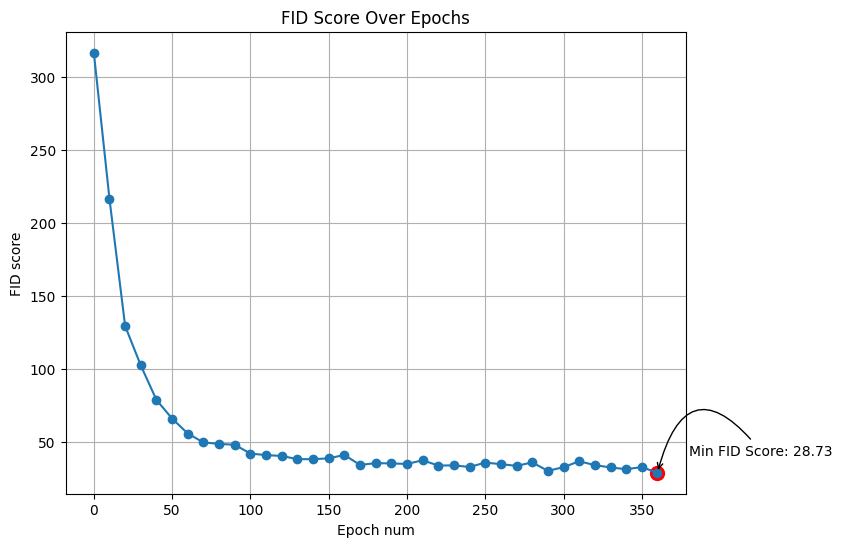

81/81 [==============================] - 30s 365ms/step - d_loss: -0.7352 - g_loss: 14.5492 - lr: 1.2951e-04
Epoch 362/802
81/81 [==============================] - 11s 139ms/step - d_loss: -0.6865 - g_loss: 16.0968 - lr: 1.2951e-04
Epoch 363/802
81/81 [==============================] - 11s 139ms/step - d_loss: -0.7707 - g_loss: 17.7884 - lr: 1.2951e-04
Epoch 364/802
81/81 [==============================] - 11s 140ms/step - d_loss: -0.7625 - g_loss: 18.8708 - lr: 1.2950e-04
Epoch 365/802
81/81 [==============================] - 11s 139ms/step - d_loss: -0.7007 - g_loss: 19.6581 - lr: 1.2950e-04
Epoch 366/802
81/81 [==============================] - 11s 139ms/step - d_loss: -0.8473 - g_loss: 17.2445 - lr: 1.2950e-04
Epoch 367/802
81/81 [==============================] - 11s 139ms/step - d_loss: -0.6313 - g_loss: 11.8269 - lr: 1.2950e-04
Epoch 368/802
81/81 [==============================] - 11s 139ms/step - d_loss: -0.7291 - g_loss: 9.9194 - lr: 1.2950e-04
Epoch 369/802
81/81 [==========

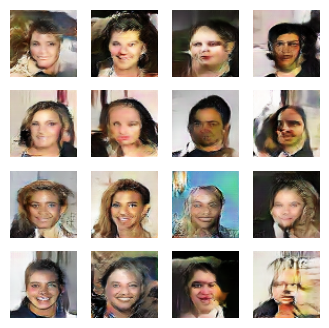

celebGenerated_wgan_370epochs


Output of the calculating FID command:
FID:  31.91006146635621

FID_scores:  [316.47507821040205, 216.20374383495974, 129.22607367736254, 102.20768137194815, 78.58580661913714, 65.83086153118569, 55.60348594285992, 49.4864039567143, 48.49285878374883, 47.864060141217465, 41.88248300089879, 40.78428200327426, 40.24305919161512, 38.00545591635256, 38.0377026873787, 38.55267289835865, 40.93918450773219, 34.060376542034646, 35.29705770185308, 35.11420948432951, 34.737326997519745, 37.25998503194009, 33.65796976779555, 33.763977170290445, 32.65655767980459, 35.68222295527562, 34.60038044214514, 33.41340459111507, 35.805250822916946, 30.006506236729848, 32.54669194833767, 36.56077104762397, 33.95565354256044, 32.3356869825586, 31.16579685343882, 32.55062881854036, 28.732366276950188, 31.91006146635621]
[316.47507821 216.20374383 129.22607368 102.20768137  78.58580662
  65.83086153  55.60348594  49.48640396  48.49285878  47.86406014
  41.882483    40.784282    40.24305919  38.00545592  38.037

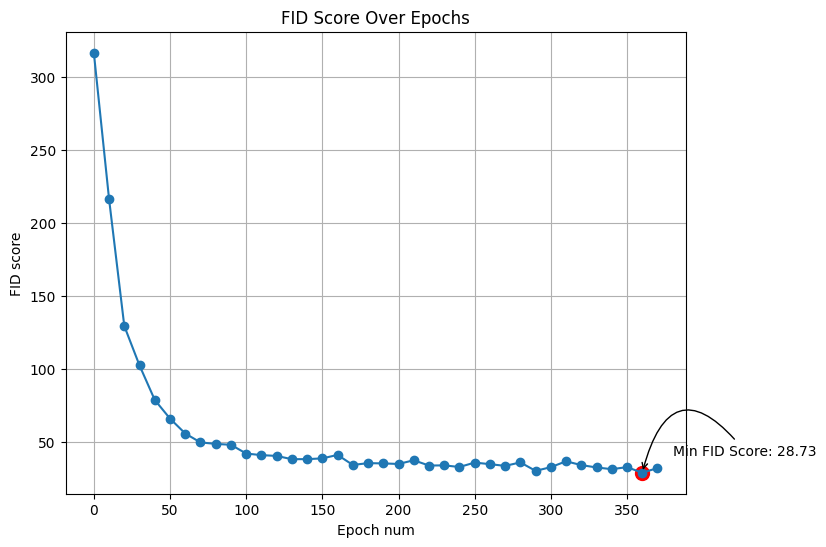

81/81 [==============================] - 29s 354ms/step - d_loss: -0.7124 - g_loss: 11.1192 - lr: 1.2949e-04
Epoch 372/802
81/81 [==============================] - 11s 140ms/step - d_loss: -0.7336 - g_loss: 8.1387 - lr: 1.2949e-04
Epoch 373/802
81/81 [==============================] - 11s 139ms/step - d_loss: -0.7629 - g_loss: 6.1639 - lr: 1.2949e-04
Epoch 374/802
81/81 [==============================] - 11s 140ms/step - d_loss: -0.6985 - g_loss: 11.0280 - lr: 1.2949e-04
Epoch 375/802
81/81 [==============================] - 11s 139ms/step - d_loss: -0.6939 - g_loss: 13.4419 - lr: 1.2949e-04
Epoch 376/802
81/81 [==============================] - 11s 139ms/step - d_loss: -0.8053 - g_loss: 14.1861 - lr: 1.2949e-04
Epoch 377/802
81/81 [==============================] - 11s 139ms/step - d_loss: -0.7484 - g_loss: 13.4192 - lr: 1.2949e-04
Epoch 378/802
81/81 [==============================] - 11s 139ms/step - d_loss: -0.6621 - g_loss: 15.8212 - lr: 1.2948e-04
Epoch 379/802
81/81 [===========

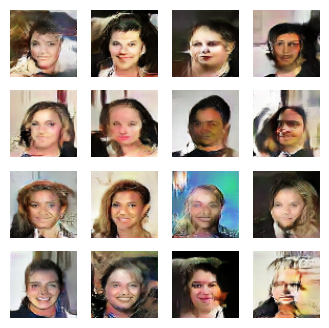

celebGenerated_wgan_380epochs


Output of the calculating FID command:
FID:  31.79345053991466

FID_scores:  [316.47507821040205, 216.20374383495974, 129.22607367736254, 102.20768137194815, 78.58580661913714, 65.83086153118569, 55.60348594285992, 49.4864039567143, 48.49285878374883, 47.864060141217465, 41.88248300089879, 40.78428200327426, 40.24305919161512, 38.00545591635256, 38.0377026873787, 38.55267289835865, 40.93918450773219, 34.060376542034646, 35.29705770185308, 35.11420948432951, 34.737326997519745, 37.25998503194009, 33.65796976779555, 33.763977170290445, 32.65655767980459, 35.68222295527562, 34.60038044214514, 33.41340459111507, 35.805250822916946, 30.006506236729848, 32.54669194833767, 36.56077104762397, 33.95565354256044, 32.3356869825586, 31.16579685343882, 32.55062881854036, 28.732366276950188, 31.91006146635621, 31.79345053991466]
[316.47507821 216.20374383 129.22607368 102.20768137  78.58580662
  65.83086153  55.60348594  49.48640396  48.49285878  47.86406014
  41.882483    40.784282    40.24305919  

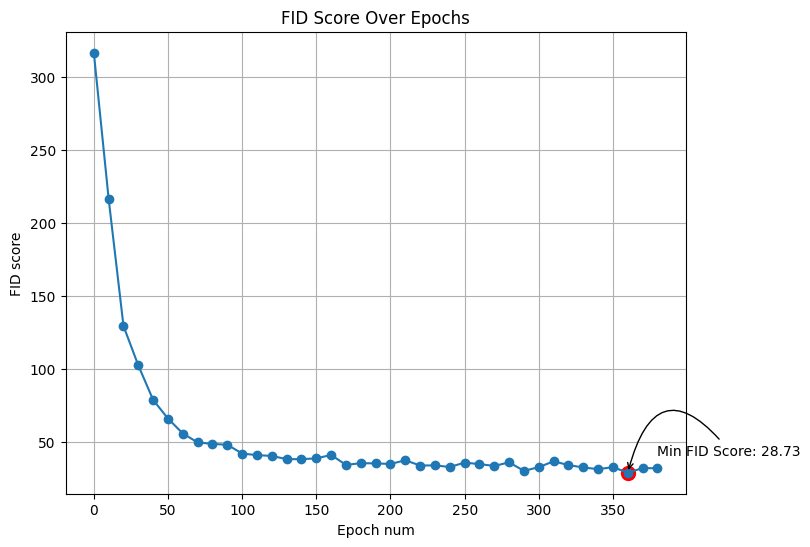

81/81 [==============================] - 29s 354ms/step - d_loss: -0.5646 - g_loss: 14.2716 - lr: 1.2948e-04
Epoch 382/802
81/81 [==============================] - 11s 140ms/step - d_loss: -0.6941 - g_loss: 13.9113 - lr: 1.2948e-04
Epoch 383/802
81/81 [==============================] - 11s 140ms/step - d_loss: -0.6567 - g_loss: 14.7803 - lr: 1.2948e-04
Epoch 384/802
81/81 [==============================] - 11s 139ms/step - d_loss: -0.6444 - g_loss: 14.5471 - lr: 1.2948e-04
Epoch 385/802
81/81 [==============================] - 11s 140ms/step - d_loss: -0.7493 - g_loss: 17.6140 - lr: 1.2948e-04
Epoch 386/802
81/81 [==============================] - 11s 139ms/step - d_loss: -0.6727 - g_loss: 18.2489 - lr: 1.2947e-04
Epoch 387/802
81/81 [==============================] - 11s 139ms/step - d_loss: -0.6031 - g_loss: 17.5757 - lr: 1.2947e-04
Epoch 388/802
81/81 [==============================] - 11s 139ms/step - d_loss: -0.6615 - g_loss: 10.8097 - lr: 1.2947e-04
Epoch 389/802
81/81 [=========

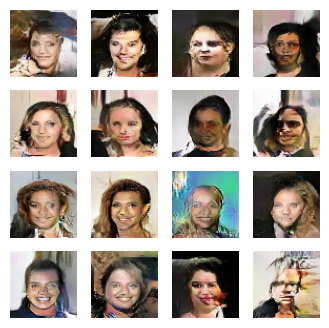

celebGenerated_wgan_390epochs


Output of the calculating FID command:
FID:  34.80521686048931

FID_scores:  [316.47507821040205, 216.20374383495974, 129.22607367736254, 102.20768137194815, 78.58580661913714, 65.83086153118569, 55.60348594285992, 49.4864039567143, 48.49285878374883, 47.864060141217465, 41.88248300089879, 40.78428200327426, 40.24305919161512, 38.00545591635256, 38.0377026873787, 38.55267289835865, 40.93918450773219, 34.060376542034646, 35.29705770185308, 35.11420948432951, 34.737326997519745, 37.25998503194009, 33.65796976779555, 33.763977170290445, 32.65655767980459, 35.68222295527562, 34.60038044214514, 33.41340459111507, 35.805250822916946, 30.006506236729848, 32.54669194833767, 36.56077104762397, 33.95565354256044, 32.3356869825586, 31.16579685343882, 32.55062881854036, 28.732366276950188, 31.91006146635621, 31.79345053991466, 34.80521686048931]
[316.47507821 216.20374383 129.22607368 102.20768137  78.58580662
  65.83086153  55.60348594  49.48640396  48.49285878  47.86406014
  41.882483    40.7842

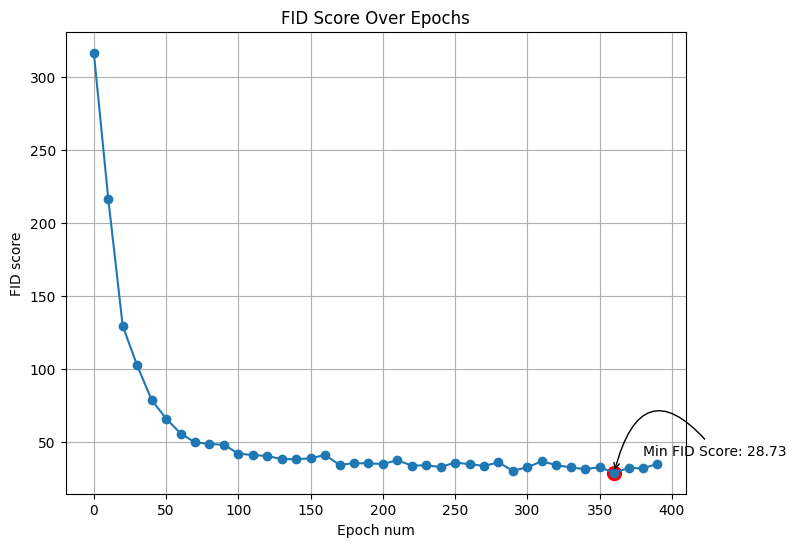

81/81 [==============================] - 29s 354ms/step - d_loss: -0.4732 - g_loss: 19.9840 - lr: 1.2947e-04
Epoch 392/802
81/81 [==============================] - 11s 140ms/step - d_loss: -0.6288 - g_loss: 17.8124 - lr: 1.2947e-04
Epoch 393/802
81/81 [==============================] - 11s 140ms/step - d_loss: -0.6043 - g_loss: 18.1424 - lr: 1.2946e-04
Epoch 394/802
81/81 [==============================] - 11s 139ms/step - d_loss: -0.6573 - g_loss: 16.3416 - lr: 1.2946e-04
Epoch 395/802
81/81 [==============================] - 11s 139ms/step - d_loss: -0.6622 - g_loss: 18.5782 - lr: 1.2946e-04
Epoch 396/802
81/81 [==============================] - 11s 139ms/step - d_loss: -0.7032 - g_loss: 16.1270 - lr: 1.2946e-04
Epoch 397/802
81/81 [==============================] - 11s 139ms/step - d_loss: -0.5911 - g_loss: 8.3467 - lr: 1.2946e-04
Epoch 398/802
81/81 [==============================] - 11s 139ms/step - d_loss: -0.5720 - g_loss: 6.4280 - lr: 1.2946e-04
Epoch 399/802
81/81 [===========

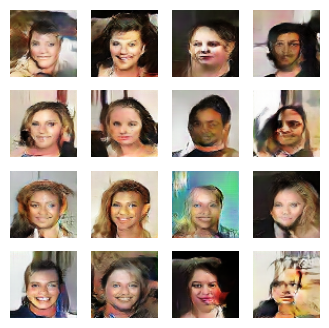

celebGenerated_wgan_400epochs


Output of the calculating FID command:
FID:  33.847797962538095

FID_scores:  [316.47507821040205, 216.20374383495974, 129.22607367736254, 102.20768137194815, 78.58580661913714, 65.83086153118569, 55.60348594285992, 49.4864039567143, 48.49285878374883, 47.864060141217465, 41.88248300089879, 40.78428200327426, 40.24305919161512, 38.00545591635256, 38.0377026873787, 38.55267289835865, 40.93918450773219, 34.060376542034646, 35.29705770185308, 35.11420948432951, 34.737326997519745, 37.25998503194009, 33.65796976779555, 33.763977170290445, 32.65655767980459, 35.68222295527562, 34.60038044214514, 33.41340459111507, 35.805250822916946, 30.006506236729848, 32.54669194833767, 36.56077104762397, 33.95565354256044, 32.3356869825586, 31.16579685343882, 32.55062881854036, 28.732366276950188, 31.91006146635621, 31.79345053991466, 34.80521686048931, 33.847797962538095]
[316.47507821 216.20374383 129.22607368 102.20768137  78.58580662
  65.83086153  55.60348594  49.48640396  48.49285878  47.86406014
 

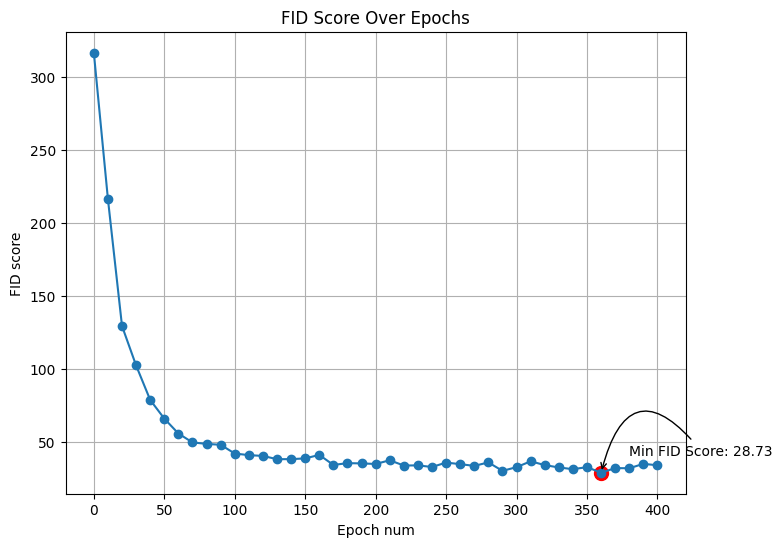

81/81 [==============================] - 29s 356ms/step - d_loss: -0.5841 - g_loss: 4.6933 - lr: 1.2945e-04
Epoch 402/802
81/81 [==============================] - 11s 140ms/step - d_loss: -0.6179 - g_loss: 6.1624 - lr: 1.2945e-04
Epoch 403/802
81/81 [==============================] - 11s 140ms/step - d_loss: -0.6355 - g_loss: 6.2454 - lr: 1.2945e-04
Epoch 404/802
81/81 [==============================] - 11s 139ms/step - d_loss: -0.6130 - g_loss: 4.7225 - lr: 1.2945e-04
Epoch 405/802
81/81 [==============================] - 11s 139ms/step - d_loss: -0.7227 - g_loss: 5.4873 - lr: 1.2945e-04
Epoch 406/802
81/81 [==============================] - 11s 139ms/step - d_loss: -0.5727 - g_loss: 0.2766 - lr: 1.2945e-04
Epoch 407/802
81/81 [==============================] - 11s 139ms/step - d_loss: -0.6454 - g_loss: 2.8511 - lr: 1.2945e-04
Epoch 408/802
81/81 [==============================] - 11s 139ms/step - d_loss: -0.5975 - g_loss: 4.9232 - lr: 1.2944e-04
Epoch 409/802
81/81 [=================

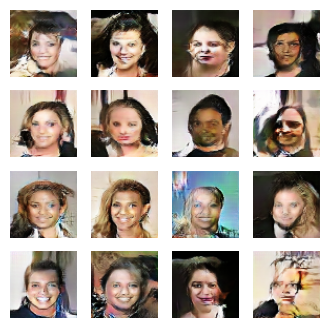

celebGenerated_wgan_410epochs


Output of the calculating FID command:
FID:  34.455626180347735

FID_scores:  [316.47507821040205, 216.20374383495974, 129.22607367736254, 102.20768137194815, 78.58580661913714, 65.83086153118569, 55.60348594285992, 49.4864039567143, 48.49285878374883, 47.864060141217465, 41.88248300089879, 40.78428200327426, 40.24305919161512, 38.00545591635256, 38.0377026873787, 38.55267289835865, 40.93918450773219, 34.060376542034646, 35.29705770185308, 35.11420948432951, 34.737326997519745, 37.25998503194009, 33.65796976779555, 33.763977170290445, 32.65655767980459, 35.68222295527562, 34.60038044214514, 33.41340459111507, 35.805250822916946, 30.006506236729848, 32.54669194833767, 36.56077104762397, 33.95565354256044, 32.3356869825586, 31.16579685343882, 32.55062881854036, 28.732366276950188, 31.91006146635621, 31.79345053991466, 34.80521686048931, 33.847797962538095, 34.455626180347735]
[316.47507821 216.20374383 129.22607368 102.20768137  78.58580662
  65.83086153  55.60348594  49.48640396  48.492

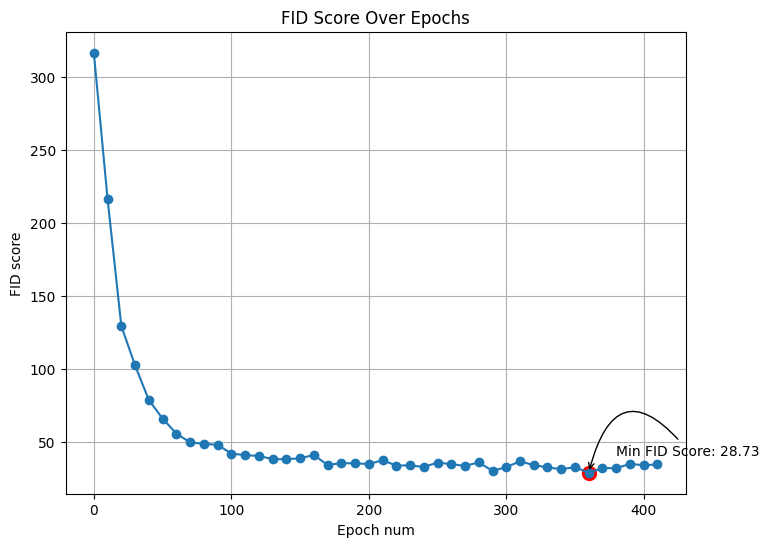

81/81 [==============================] - 29s 360ms/step - d_loss: -0.5298 - g_loss: 10.8520 - lr: 1.2944e-04
Epoch 412/802
81/81 [==============================] - 11s 140ms/step - d_loss: -0.6087 - g_loss: 7.3032 - lr: 1.2944e-04
Epoch 413/802
81/81 [==============================] - 11s 139ms/step - d_loss: -0.6126 - g_loss: 4.7300 - lr: 1.2944e-04
Epoch 414/802
81/81 [==============================] - 11s 140ms/step - d_loss: -0.6125 - g_loss: 6.3081 - lr: 1.2944e-04
Epoch 415/802
81/81 [==============================] - 11s 139ms/step - d_loss: -0.7495 - g_loss: 5.8477 - lr: 1.2943e-04
Epoch 416/802
81/81 [==============================] - 11s 140ms/step - d_loss: -0.6762 - g_loss: 3.7830 - lr: 1.2943e-04
Epoch 417/802
81/81 [==============================] - 11s 139ms/step - d_loss: -0.6307 - g_loss: -1.4750 - lr: 1.2943e-04
Epoch 418/802
81/81 [==============================] - 11s 139ms/step - d_loss: -0.5385 - g_loss: -4.1952 - lr: 1.2943e-04
Epoch 419/802
81/81 [==============

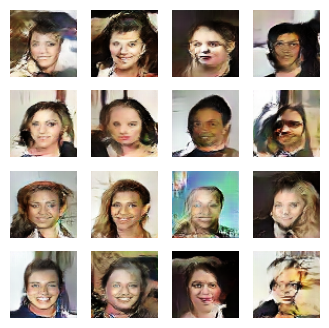

celebGenerated_wgan_420epochs


Output of the calculating FID command:
FID:  35.20218904629402

FID_scores:  [316.47507821040205, 216.20374383495974, 129.22607367736254, 102.20768137194815, 78.58580661913714, 65.83086153118569, 55.60348594285992, 49.4864039567143, 48.49285878374883, 47.864060141217465, 41.88248300089879, 40.78428200327426, 40.24305919161512, 38.00545591635256, 38.0377026873787, 38.55267289835865, 40.93918450773219, 34.060376542034646, 35.29705770185308, 35.11420948432951, 34.737326997519745, 37.25998503194009, 33.65796976779555, 33.763977170290445, 32.65655767980459, 35.68222295527562, 34.60038044214514, 33.41340459111507, 35.805250822916946, 30.006506236729848, 32.54669194833767, 36.56077104762397, 33.95565354256044, 32.3356869825586, 31.16579685343882, 32.55062881854036, 28.732366276950188, 31.91006146635621, 31.79345053991466, 34.80521686048931, 33.847797962538095, 34.455626180347735, 35.20218904629402]
[316.47507821 216.20374383 129.22607368 102.20768137  78.58580662
  65.83086153  55.60348594  4

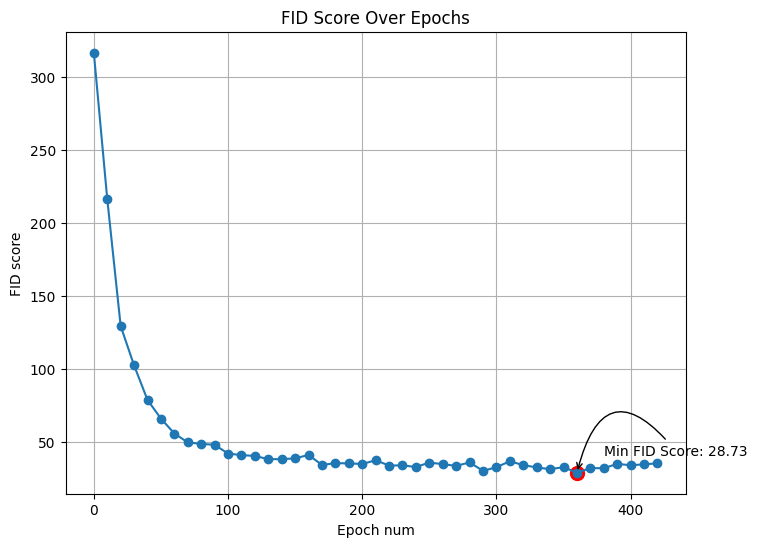

81/81 [==============================] - 29s 354ms/step - d_loss: -0.5244 - g_loss: -1.4113 - lr: 1.2943e-04
Epoch 422/802
81/81 [==============================] - 11s 140ms/step - d_loss: -0.4543 - g_loss: -3.2333 - lr: 1.2942e-04
Epoch 423/802
81/81 [==============================] - 11s 139ms/step - d_loss: -0.5670 - g_loss: -5.9021 - lr: 1.2942e-04
Epoch 424/802
81/81 [==============================] - 11s 140ms/step - d_loss: -0.4618 - g_loss: -8.2521 - lr: 1.2942e-04
Epoch 425/802
81/81 [==============================] - 11s 139ms/step - d_loss: -0.5509 - g_loss: -4.0207 - lr: 1.2942e-04
Epoch 426/802
81/81 [==============================] - 11s 139ms/step - d_loss: -0.4822 - g_loss: -5.8879 - lr: 1.2942e-04
Epoch 427/802
81/81 [==============================] - 11s 139ms/step - d_loss: -0.6269 - g_loss: -5.6120 - lr: 1.2942e-04
Epoch 428/802
81/81 [==============================] - 11s 139ms/step - d_loss: -0.5535 - g_loss: -8.9429 - lr: 1.2942e-04
Epoch 429/802
81/81 [=========

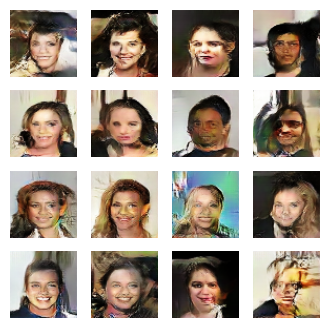

celebGenerated_wgan_430epochs


Output of the calculating FID command:
FID:  33.756298504028734

FID_scores:  [316.47507821040205, 216.20374383495974, 129.22607367736254, 102.20768137194815, 78.58580661913714, 65.83086153118569, 55.60348594285992, 49.4864039567143, 48.49285878374883, 47.864060141217465, 41.88248300089879, 40.78428200327426, 40.24305919161512, 38.00545591635256, 38.0377026873787, 38.55267289835865, 40.93918450773219, 34.060376542034646, 35.29705770185308, 35.11420948432951, 34.737326997519745, 37.25998503194009, 33.65796976779555, 33.763977170290445, 32.65655767980459, 35.68222295527562, 34.60038044214514, 33.41340459111507, 35.805250822916946, 30.006506236729848, 32.54669194833767, 36.56077104762397, 33.95565354256044, 32.3356869825586, 31.16579685343882, 32.55062881854036, 28.732366276950188, 31.91006146635621, 31.79345053991466, 34.80521686048931, 33.847797962538095, 34.455626180347735, 35.20218904629402, 33.756298504028734]
[316.47507821 216.20374383 129.22607368 102.20768137  78.58580662
  65.830

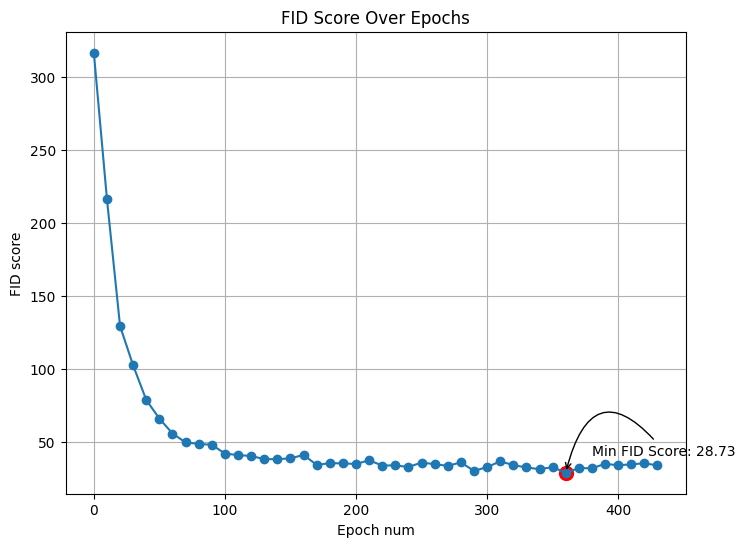

81/81 [==============================] - 29s 355ms/step - d_loss: -0.5269 - g_loss: -9.2383 - lr: 1.2941e-04
Epoch 432/802
81/81 [==============================] - 11s 140ms/step - d_loss: -0.5299 - g_loss: -8.7966 - lr: 1.2941e-04
Epoch 433/802
81/81 [==============================] - 11s 140ms/step - d_loss: -0.6305 - g_loss: -3.8518 - lr: 1.2941e-04
Epoch 434/802
81/81 [==============================] - 11s 140ms/step - d_loss: -0.7015 - g_loss: -1.7490 - lr: 1.2941e-04
Epoch 435/802
81/81 [==============================] - 11s 139ms/step - d_loss: -0.4551 - g_loss: -4.1716 - lr: 1.2941e-04
Epoch 436/802
81/81 [==============================] - 11s 139ms/step - d_loss: -0.6039 - g_loss: -7.8733 - lr: 1.2941e-04
Epoch 437/802
81/81 [==============================] - 11s 139ms/step - d_loss: -0.6840 - g_loss: -3.1082 - lr: 1.2940e-04
Epoch 438/802
81/81 [==============================] - 11s 139ms/step - d_loss: -0.4569 - g_loss: -3.2714 - lr: 1.2940e-04
Epoch 439/802
81/81 [=========

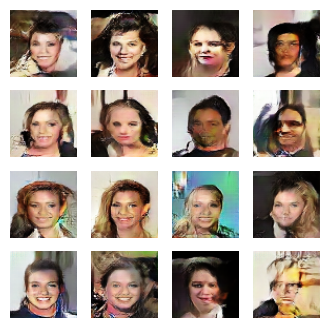

celebGenerated_wgan_440epochs


Output of the calculating FID command:
FID:  31.008638394852397

FID_scores:  [316.47507821040205, 216.20374383495974, 129.22607367736254, 102.20768137194815, 78.58580661913714, 65.83086153118569, 55.60348594285992, 49.4864039567143, 48.49285878374883, 47.864060141217465, 41.88248300089879, 40.78428200327426, 40.24305919161512, 38.00545591635256, 38.0377026873787, 38.55267289835865, 40.93918450773219, 34.060376542034646, 35.29705770185308, 35.11420948432951, 34.737326997519745, 37.25998503194009, 33.65796976779555, 33.763977170290445, 32.65655767980459, 35.68222295527562, 34.60038044214514, 33.41340459111507, 35.805250822916946, 30.006506236729848, 32.54669194833767, 36.56077104762397, 33.95565354256044, 32.3356869825586, 31.16579685343882, 32.55062881854036, 28.732366276950188, 31.91006146635621, 31.79345053991466, 34.80521686048931, 33.847797962538095, 34.455626180347735, 35.20218904629402, 33.756298504028734, 31.008638394852397]
[316.47507821 216.20374383 129.22607368 102.20768137  

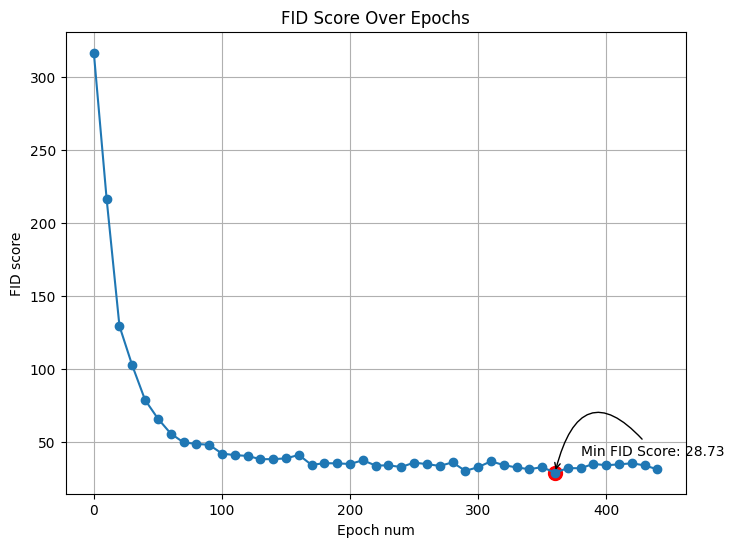

81/81 [==============================] - 29s 358ms/step - d_loss: -0.5205 - g_loss: -5.0550 - lr: 1.2940e-04
Epoch 442/802
81/81 [==============================] - 11s 140ms/step - d_loss: -0.6271 - g_loss: -5.7068 - lr: 1.2940e-04
Epoch 443/802
81/81 [==============================] - 11s 140ms/step - d_loss: -0.5280 - g_loss: -4.9818 - lr: 1.2940e-04
Epoch 444/802
81/81 [==============================] - 11s 139ms/step - d_loss: -0.4174 - g_loss: -7.8005e-04 - lr: 1.2939e-04
Epoch 445/802
81/81 [==============================] - 11s 140ms/step - d_loss: -0.4804 - g_loss: -3.4643 - lr: 1.2939e-04
Epoch 446/802
81/81 [==============================] - 11s 140ms/step - d_loss: -0.4521 - g_loss: -2.3552 - lr: 1.2939e-04
Epoch 447/802
81/81 [==============================] - 11s 140ms/step - d_loss: -0.4910 - g_loss: -8.5061 - lr: 1.2939e-04
Epoch 448/802
81/81 [==============================] - 11s 139ms/step - d_loss: -0.4980 - g_loss: -5.4959 - lr: 1.2939e-04
Epoch 449/802
81/81 [=====

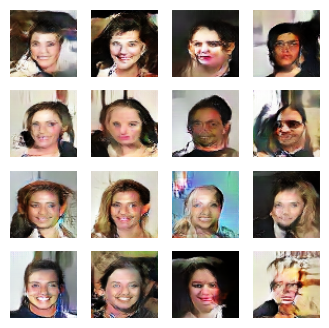

celebGenerated_wgan_450epochs


Output of the calculating FID command:
FID:  31.972992781141045

FID_scores:  [316.47507821040205, 216.20374383495974, 129.22607367736254, 102.20768137194815, 78.58580661913714, 65.83086153118569, 55.60348594285992, 49.4864039567143, 48.49285878374883, 47.864060141217465, 41.88248300089879, 40.78428200327426, 40.24305919161512, 38.00545591635256, 38.0377026873787, 38.55267289835865, 40.93918450773219, 34.060376542034646, 35.29705770185308, 35.11420948432951, 34.737326997519745, 37.25998503194009, 33.65796976779555, 33.763977170290445, 32.65655767980459, 35.68222295527562, 34.60038044214514, 33.41340459111507, 35.805250822916946, 30.006506236729848, 32.54669194833767, 36.56077104762397, 33.95565354256044, 32.3356869825586, 31.16579685343882, 32.55062881854036, 28.732366276950188, 31.91006146635621, 31.79345053991466, 34.80521686048931, 33.847797962538095, 34.455626180347735, 35.20218904629402, 33.756298504028734, 31.008638394852397, 31.972992781141045]
[316.47507821 216.20374383 129.226

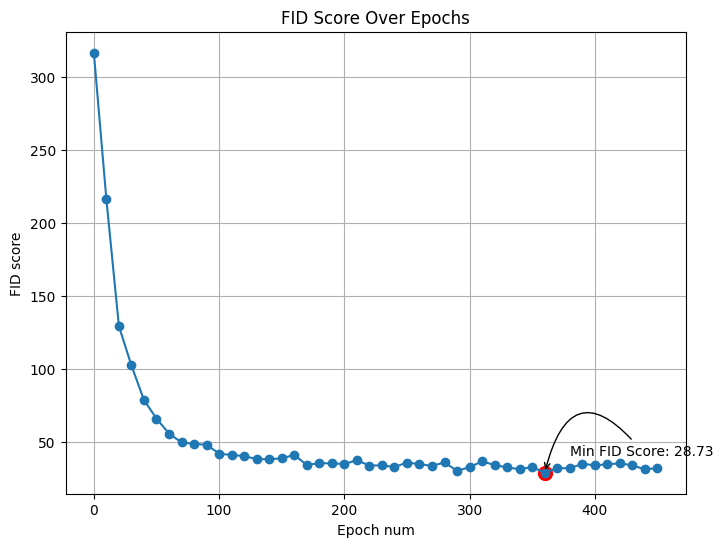

81/81 [==============================] - 30s 366ms/step - d_loss: -0.4752 - g_loss: -4.6457 - lr: 1.2939e-04
Epoch 452/802
81/81 [==============================] - 11s 140ms/step - d_loss: -0.5139 - g_loss: -5.1622 - lr: 1.2938e-04
Epoch 453/802
81/81 [==============================] - 11s 139ms/step - d_loss: -0.6709 - g_loss: -5.1509 - lr: 1.2938e-04
Epoch 454/802
81/81 [==============================] - 11s 139ms/step - d_loss: -0.5311 - g_loss: -8.3109 - lr: 1.2938e-04
Epoch 455/802
81/81 [==============================] - 11s 139ms/step - d_loss: -0.5060 - g_loss: -1.6367 - lr: 1.2938e-04
Epoch 456/802
81/81 [==============================] - 11s 139ms/step - d_loss: -0.4109 - g_loss: -1.1591 - lr: 1.2938e-04
Epoch 457/802
81/81 [==============================] - 11s 139ms/step - d_loss: -0.5761 - g_loss: -6.2535 - lr: 1.2938e-04
Epoch 458/802
81/81 [==============================] - 11s 139ms/step - d_loss: -0.5241 - g_loss: -8.7317 - lr: 1.2938e-04
Epoch 459/802
81/81 [=========

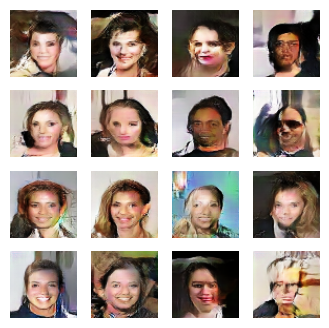

celebGenerated_wgan_460epochs


Output of the calculating FID command:
FID:  31.774222880271054

FID_scores:  [316.47507821040205, 216.20374383495974, 129.22607367736254, 102.20768137194815, 78.58580661913714, 65.83086153118569, 55.60348594285992, 49.4864039567143, 48.49285878374883, 47.864060141217465, 41.88248300089879, 40.78428200327426, 40.24305919161512, 38.00545591635256, 38.0377026873787, 38.55267289835865, 40.93918450773219, 34.060376542034646, 35.29705770185308, 35.11420948432951, 34.737326997519745, 37.25998503194009, 33.65796976779555, 33.763977170290445, 32.65655767980459, 35.68222295527562, 34.60038044214514, 33.41340459111507, 35.805250822916946, 30.006506236729848, 32.54669194833767, 36.56077104762397, 33.95565354256044, 32.3356869825586, 31.16579685343882, 32.55062881854036, 28.732366276950188, 31.91006146635621, 31.79345053991466, 34.80521686048931, 33.847797962538095, 34.455626180347735, 35.20218904629402, 33.756298504028734, 31.008638394852397, 31.972992781141045, 31.774222880271054]
[316.47507821 

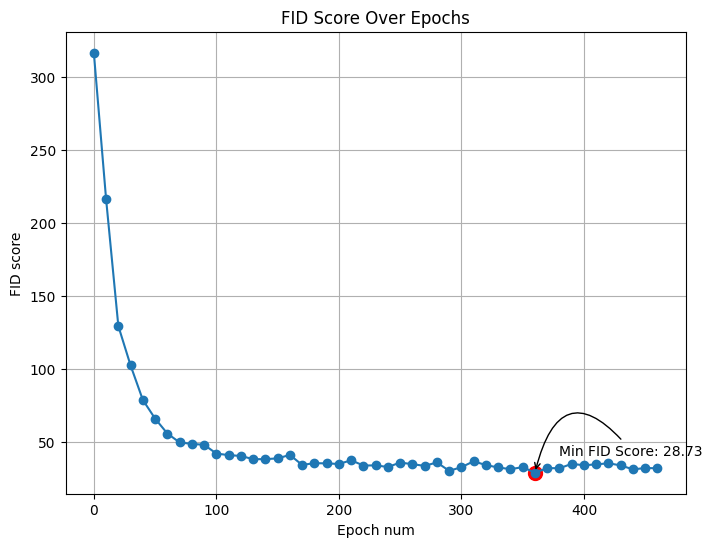

81/81 [==============================] - 30s 366ms/step - d_loss: -0.4695 - g_loss: -14.8114 - lr: 1.2937e-04
Epoch 462/802
81/81 [==============================] - 11s 140ms/step - d_loss: -0.4874 - g_loss: -11.0239 - lr: 1.2937e-04
Epoch 463/802
81/81 [==============================] - 11s 139ms/step - d_loss: -0.4516 - g_loss: -13.5772 - lr: 1.2937e-04
Epoch 464/802
81/81 [==============================] - 11s 139ms/step - d_loss: -0.3774 - g_loss: -12.8584 - lr: 1.2937e-04
Epoch 465/802
81/81 [==============================] - 11s 139ms/step - d_loss: -0.3821 - g_loss: -11.6280 - lr: 1.2937e-04
Epoch 466/802
81/81 [==============================] - 11s 140ms/step - d_loss: -0.5182 - g_loss: -11.6575 - lr: 1.2936e-04
Epoch 467/802
81/81 [==============================] - 11s 139ms/step - d_loss: -0.4406 - g_loss: -11.9096 - lr: 1.2936e-04
Epoch 468/802
81/81 [==============================] - 11s 140ms/step - d_loss: -0.5933 - g_loss: -13.0904 - lr: 1.2936e-04
Epoch 469/802
81/81 [=

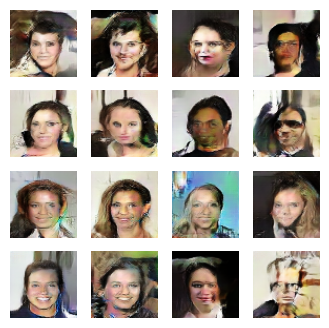

celebGenerated_wgan_470epochs


Output of the calculating FID command:
FID:  35.46702669424204

FID_scores:  [316.47507821040205, 216.20374383495974, 129.22607367736254, 102.20768137194815, 78.58580661913714, 65.83086153118569, 55.60348594285992, 49.4864039567143, 48.49285878374883, 47.864060141217465, 41.88248300089879, 40.78428200327426, 40.24305919161512, 38.00545591635256, 38.0377026873787, 38.55267289835865, 40.93918450773219, 34.060376542034646, 35.29705770185308, 35.11420948432951, 34.737326997519745, 37.25998503194009, 33.65796976779555, 33.763977170290445, 32.65655767980459, 35.68222295527562, 34.60038044214514, 33.41340459111507, 35.805250822916946, 30.006506236729848, 32.54669194833767, 36.56077104762397, 33.95565354256044, 32.3356869825586, 31.16579685343882, 32.55062881854036, 28.732366276950188, 31.91006146635621, 31.79345053991466, 34.80521686048931, 33.847797962538095, 34.455626180347735, 35.20218904629402, 33.756298504028734, 31.008638394852397, 31.972992781141045, 31.774222880271054, 35.467026694242

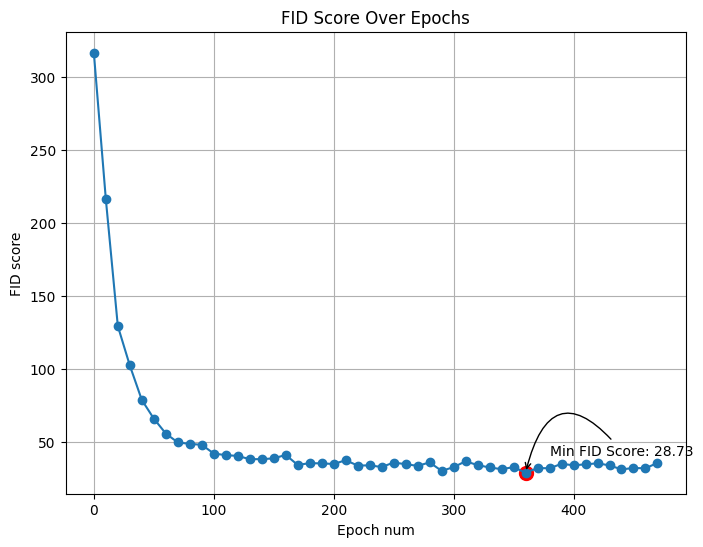

81/81 [==============================] - 29s 363ms/step - d_loss: -0.4545 - g_loss: -13.7131 - lr: 1.2936e-04
Epoch 472/802
81/81 [==============================] - 11s 140ms/step - d_loss: -0.2958 - g_loss: -14.3900 - lr: 1.2936e-04
Epoch 473/802
81/81 [==============================] - 11s 139ms/step - d_loss: -0.5083 - g_loss: -10.7781 - lr: 1.2936e-04
Epoch 474/802
81/81 [==============================] - 11s 139ms/step - d_loss: -0.5082 - g_loss: -6.9363 - lr: 1.2935e-04
Epoch 475/802
81/81 [==============================] - 11s 140ms/step - d_loss: -0.3821 - g_loss: -9.9205 - lr: 1.2935e-04
Epoch 476/802
81/81 [==============================] - 11s 139ms/step - d_loss: -0.4063 - g_loss: -11.2007 - lr: 1.2935e-04
Epoch 477/802
81/81 [==============================] - 11s 139ms/step - d_loss: -0.4737 - g_loss: -8.2290 - lr: 1.2935e-04
Epoch 478/802
81/81 [==============================] - 11s 139ms/step - d_loss: -0.5897 - g_loss: -10.0582 - lr: 1.2935e-04
Epoch 479/802
81/81 [====

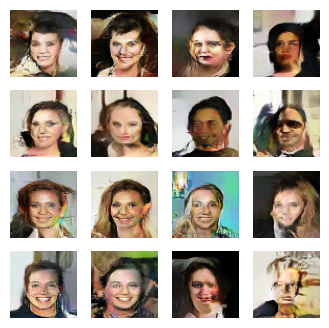

celebGenerated_wgan_480epochs


Output of the calculating FID command:
FID:  32.000718402248395

FID_scores:  [316.47507821040205, 216.20374383495974, 129.22607367736254, 102.20768137194815, 78.58580661913714, 65.83086153118569, 55.60348594285992, 49.4864039567143, 48.49285878374883, 47.864060141217465, 41.88248300089879, 40.78428200327426, 40.24305919161512, 38.00545591635256, 38.0377026873787, 38.55267289835865, 40.93918450773219, 34.060376542034646, 35.29705770185308, 35.11420948432951, 34.737326997519745, 37.25998503194009, 33.65796976779555, 33.763977170290445, 32.65655767980459, 35.68222295527562, 34.60038044214514, 33.41340459111507, 35.805250822916946, 30.006506236729848, 32.54669194833767, 36.56077104762397, 33.95565354256044, 32.3356869825586, 31.16579685343882, 32.55062881854036, 28.732366276950188, 31.91006146635621, 31.79345053991466, 34.80521686048931, 33.847797962538095, 34.455626180347735, 35.20218904629402, 33.756298504028734, 31.008638394852397, 31.972992781141045, 31.774222880271054, 35.46702669424

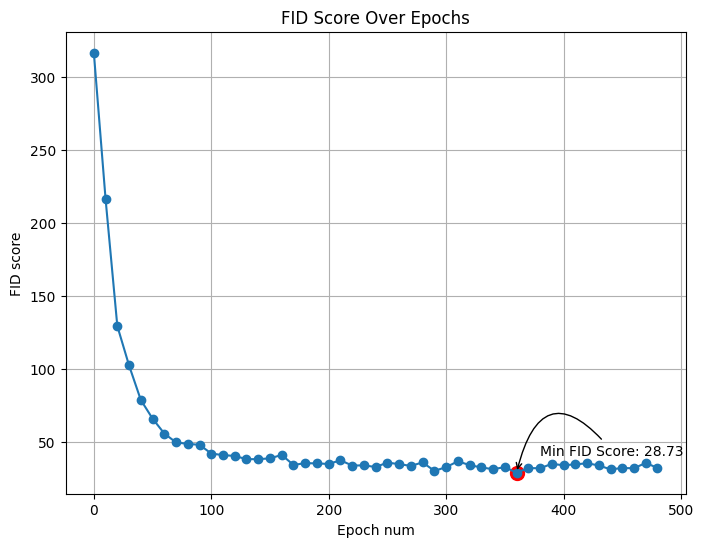

81/81 [==============================] - 29s 354ms/step - d_loss: -0.3761 - g_loss: -7.5182 - lr: 1.2934e-04
Epoch 482/802
81/81 [==============================] - 11s 140ms/step - d_loss: -0.4301 - g_loss: -7.9157 - lr: 1.2934e-04
Epoch 483/802
81/81 [==============================] - 11s 139ms/step - d_loss: -0.4721 - g_loss: -11.3919 - lr: 1.2934e-04
Epoch 484/802
81/81 [==============================] - 11s 139ms/step - d_loss: -0.4652 - g_loss: -12.6856 - lr: 1.2934e-04
Epoch 485/802
81/81 [==============================] - 11s 139ms/step - d_loss: -0.4253 - g_loss: -15.1533 - lr: 1.2934e-04
Epoch 486/802
81/81 [==============================] - 11s 139ms/step - d_loss: -0.3405 - g_loss: -14.5228 - lr: 1.2934e-04
Epoch 487/802
81/81 [==============================] - 11s 139ms/step - d_loss: -0.4095 - g_loss: -13.6755 - lr: 1.2934e-04
Epoch 488/802
81/81 [==============================] - 11s 139ms/step - d_loss: -0.4636 - g_loss: -11.4349 - lr: 1.2933e-04
Epoch 489/802
81/81 [===

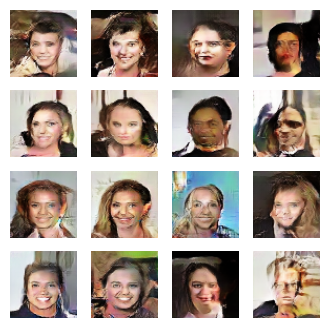

celebGenerated_wgan_490epochs


Output of the calculating FID command:
FID:  33.58190373103798

FID_scores:  [316.47507821040205, 216.20374383495974, 129.22607367736254, 102.20768137194815, 78.58580661913714, 65.83086153118569, 55.60348594285992, 49.4864039567143, 48.49285878374883, 47.864060141217465, 41.88248300089879, 40.78428200327426, 40.24305919161512, 38.00545591635256, 38.0377026873787, 38.55267289835865, 40.93918450773219, 34.060376542034646, 35.29705770185308, 35.11420948432951, 34.737326997519745, 37.25998503194009, 33.65796976779555, 33.763977170290445, 32.65655767980459, 35.68222295527562, 34.60038044214514, 33.41340459111507, 35.805250822916946, 30.006506236729848, 32.54669194833767, 36.56077104762397, 33.95565354256044, 32.3356869825586, 31.16579685343882, 32.55062881854036, 28.732366276950188, 31.91006146635621, 31.79345053991466, 34.80521686048931, 33.847797962538095, 34.455626180347735, 35.20218904629402, 33.756298504028734, 31.008638394852397, 31.972992781141045, 31.774222880271054, 35.467026694242

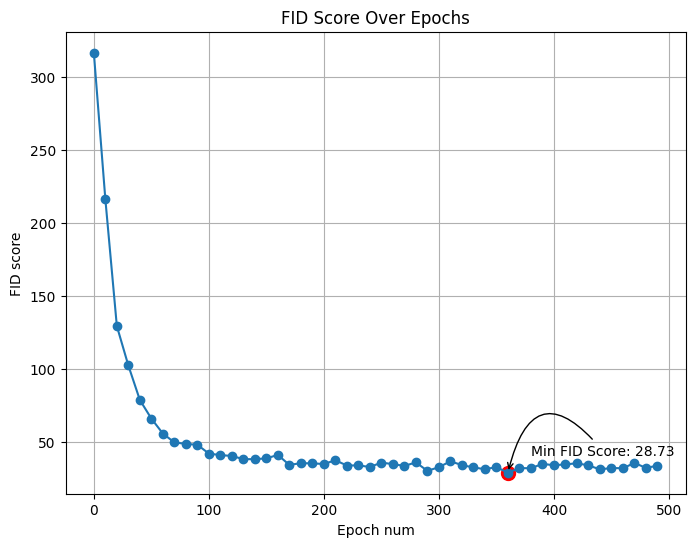

81/81 [==============================] - 29s 355ms/step - d_loss: -0.4491 - g_loss: -19.5377 - lr: 1.2933e-04
Epoch 492/802
81/81 [==============================] - 11s 140ms/step - d_loss: -0.4349 - g_loss: -19.3280 - lr: 1.2933e-04
Epoch 493/802
81/81 [==============================] - 11s 140ms/step - d_loss: -0.3797 - g_loss: -15.6831 - lr: 1.2933e-04
Epoch 494/802
81/81 [==============================] - 11s 140ms/step - d_loss: -0.4182 - g_loss: -15.6302 - lr: 1.2933e-04
Epoch 495/802
81/81 [==============================] - 11s 139ms/step - d_loss: -0.2852 - g_loss: -13.0682 - lr: 1.2933e-04
Epoch 496/802
81/81 [==============================] - 11s 139ms/step - d_loss: -0.3481 - g_loss: -12.6048 - lr: 1.2932e-04
Epoch 497/802
81/81 [==============================] - 11s 139ms/step - d_loss: -0.3578 - g_loss: -8.2844 - lr: 1.2932e-04
Epoch 498/802
81/81 [==============================] - 11s 139ms/step - d_loss: -0.3342 - g_loss: -10.8576 - lr: 1.2932e-04
Epoch 499/802
81/81 [==

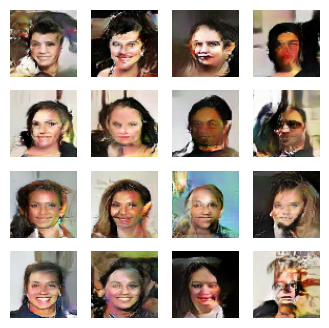

celebGenerated_wgan_500epochs


Output of the calculating FID command:
FID:  34.14180363584401

FID_scores:  [316.47507821040205, 216.20374383495974, 129.22607367736254, 102.20768137194815, 78.58580661913714, 65.83086153118569, 55.60348594285992, 49.4864039567143, 48.49285878374883, 47.864060141217465, 41.88248300089879, 40.78428200327426, 40.24305919161512, 38.00545591635256, 38.0377026873787, 38.55267289835865, 40.93918450773219, 34.060376542034646, 35.29705770185308, 35.11420948432951, 34.737326997519745, 37.25998503194009, 33.65796976779555, 33.763977170290445, 32.65655767980459, 35.68222295527562, 34.60038044214514, 33.41340459111507, 35.805250822916946, 30.006506236729848, 32.54669194833767, 36.56077104762397, 33.95565354256044, 32.3356869825586, 31.16579685343882, 32.55062881854036, 28.732366276950188, 31.91006146635621, 31.79345053991466, 34.80521686048931, 33.847797962538095, 34.455626180347735, 35.20218904629402, 33.756298504028734, 31.008638394852397, 31.972992781141045, 31.774222880271054, 35.467026694242

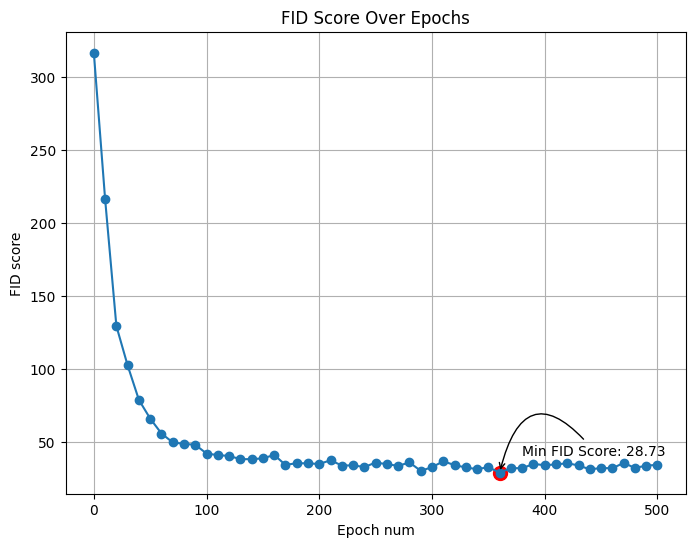

81/81 [==============================] - 28s 353ms/step - d_loss: -0.2739 - g_loss: -7.2868 - lr: 1.2932e-04
Epoch 502/802
81/81 [==============================] - 11s 140ms/step - d_loss: -0.4632 - g_loss: -7.4999 - lr: 1.2932e-04
Epoch 503/802
55/81 [===================>..........] - ETA: 3s - d_loss: -0.3030 - g_loss: -9.5568

In [ ]:
NUM_EPOCHS = 802 # number of epochs
wgan_gp.fit(train_images, epochs=NUM_EPOCHS, callbacks=[GANMonitor(num_img=16, latent_dim=LATENT_DIM), lr_scheduler]) # new: add lr_scheduler